# import

In [8]:
import requests  
import json  
import pandas as pd  
import numpy as np  
import nltk  
from textblob import TextBlob  
from nltk.sentiment import SentimentIntensityAnalyzer  
from transformers import pipeline  
import yfinance as yf  
import matplotlib.pyplot as plt  
import seaborn as sns  
import tweepy  
import praw  

from bs4 import BeautifulSoup  

import time  


# scraping finance news

In [6]:
import requests
import pandas as pd

# Yahoo Finance news API for market news
url = "https://query1.finance.yahoo.com/v1/finance/search?q=market&newsCount=20"

headers = {"User-Agent": "Mozilla/5.0"}

response = requests.get(url, headers=headers)
data = response.json()

# Extract news headlines and links
news_data = []
for article in data.get("news", []):
    headline = article.get("title", "No Title")
    link = article.get("link", "#")
    news_data.append({"Headline": headline, "Link": link})

# Convert to DataFrame
news_df = pd.DataFrame(news_data)
print(news_df.head())


                                            Headline  \
0  Trump's inauguration looms as earnings season ...   

                                                Link  
0  https://finance.yahoo.com/news/trumps-inaugura...  


In [7]:
import requests
import pandas as pd

# Yahoo Finance API for latest stock market news
url = "https://query1.finance.yahoo.com/v1/finance/search?q=stock%20market&newsCount=20"

headers = {"User-Agent": "Mozilla/5.0"}

response = requests.get(url, headers=headers)
data = response.json()

# Extract recent news headlines & links
news_data = []
for article in data.get("news", []):
    headline = article.get("title", "No Title")
    link = article.get("link", "#")
    news_data.append({"Headline": headline, "Link": link})

# Convert to DataFrame
news_df = pd.DataFrame(news_data)
print(news_df.head())


                                            Headline  \
0  Investors exiting US equities and looking to E...   
1  Morgan Stanley Sees Opportunity in the Europea...   
2  Daily ETF Flows: SPY, VTI and BIL Lead Inflows...   
3  Why VOO's Massive Popularity Won't Leave SPY O...   

                                                Link  
0  https://finance.yahoo.com/video/investors-exit...  
1  https://finance.yahoo.com/m/f92c5d14-92fe-3b03...  
2  https://finance.yahoo.com/m/d87b7fa9-0217-3f73...  
3  https://finance.yahoo.com/m/35260e07-787a-3eb7...  


# we will shift to google, since yahoo finance isnot giving up to date data

In [9]:
from bs4 import BeautifulSoup
import requests
import pandas as pd

# Google News search URL for stock market news
url = "https://www.google.com/search?q=stock+market+news&tbm=nws"

# Headers to mimic a real browser
headers = {"User-Agent": "Mozilla/5.0"}

response = requests.get(url, headers=headers)
soup = BeautifulSoup(response.text, "html.parser")

# Extract headlines & links
articles = soup.find_all("div", class_="BNeawe vvjwJb AP7Wnd")

news_data = []
for article in articles:
    headline = article.text
    link = "https://www.google.com" + article.find_parent("a")["href"]
    news_data.append({"Headline": headline, "Link": link})

# Convert to DataFrame
news_df = pd.DataFrame(news_data)
print(news_df.head())


Empty DataFrame
Columns: []
Index: []


In [4]:
import feedparser
import pandas as pd

# Google News RSS feed for stock market news
rss_url = "https://news.google.com/rss/search?q=stock+market&hl=en-US&gl=US&ceid=US:en"

# Parse the RSS feed
feed = feedparser.parse(rss_url)

# Extract headlines & links
news_data = [{"Headline": entry.title, "Link": entry.link} for entry in feed.entries]

# Convert to DataFrame
news_df = pd.DataFrame(news_data)
print(news_df.head())


                                            Headline  \
0  Stock market today: Dow, S&P 500, Nasdaq tank ...   
1  How the stock market's woes can spill over int...   
2  Stock market today: Wall Street slips followin...   
3  The stock market is not the economy, but this ...   
4  Navigating Trump-Era Market Volatility: How to...   

                                                Link  
0  https://news.google.com/rss/articles/CBMi1gFBV...  
1  https://news.google.com/rss/articles/CBMiuwFBV...  
2  https://news.google.com/rss/articles/CBMimgFBV...  
3  https://news.google.com/rss/articles/CBMirAFBV...  
4  https://news.google.com/rss/articles/CBMijgFBV...  


In [1]:
import feedparser
import pandas as pd
from urllib.parse import urlparse

# Google News RSS feed for stock market news
rss_url = "https://news.google.com/rss/search?q=stock+market&hl=en-US&gl=US&ceid=US:en"

# Parse the RSS feed
feed = feedparser.parse(rss_url)

# Extract headlines, links, sources, and dates
news_data = []
for entry in feed.entries:
    parsed_url = urlparse(entry.link)
    source_site = parsed_url.netloc  # Extract domain name (source site)
    
    # Get publication date (if available)
    published_date = entry.get("published", "No date available")

    news_data.append({
        "Headline": entry.title,
        "Link": entry.link,
        "Source": source_site,
        "Published Date": published_date
    })

# Convert to DataFrame
news_df = pd.DataFrame(news_data)

# Save to CSV file
news_df.to_csv("google_news_data.csv", index=False)

# Print summary
print(f"Total articles extracted: {len(news_df)}")
print("Unique sources found:", news_df['Source'].nunique())
print(news_df['Source'].value_counts())  # Show count of articles per source
print(news_df.head())


Total articles extracted: 102
Unique sources found: 1
Source
news.google.com    102
Name: count, dtype: int64
                                            Headline  \
0  Stock market today: Dow drops as S&P 500, Nasd...   
1  5 Things to Know Before the Stock Market Opens...   
2  Stock market crash today: BSE Sensex ends over...   
3  Closing Bell: Trump tariff jitters sink market...   
4  Stock Market Crash: Sensex slumps 1,391 pts, N...   

                                                Link           Source  \
0  https://news.google.com/rss/articles/CBMi1AFBV...  news.google.com   
1  https://news.google.com/rss/articles/CBMinwFBV...  news.google.com   
2  https://news.google.com/rss/articles/CBMiqgJBV...  news.google.com   
3  https://news.google.com/rss/articles/CBMi7AFBV...  news.google.com   
4  https://news.google.com/rss/articles/CBMinwJBV...  news.google.com   

                  Published Date  
0  Tue, 01 Apr 2025 15:02:01 GMT  
1  Tue, 01 Apr 2025 11:45:17 GMT  
2  Tue, 0

# we scraped thru data, now we will do sentiment analysis from social media, X and reddit

In [3]:
import snscrape
print("snscrape is installed correctly!")


snscrape is installed correctly!


In [4]:
import sys
print(sys.executable)


C:\Program Files\Python313\python.exe


In [2]:
import tweepy
import pandas as pd
from textblob import TextBlob
from datetime import datetime, timezone, timedelta
import time

# 1. AUTH - Replace with your bearer token
BEARER_TOKEN = "AAAAAAAAAAAAAAAAAAAAAP7M0AEAAAAAQgWi8D80Kxm3svf5nTMdUpAQCu0%3DvWvMEDt1Rwk718PMHo7wWAscLrsEMCEvJ1pJ1MnjXfabUxJ3vp"
client = tweepy.Client(bearer_token=BEARER_TOKEN, wait_on_rate_limit=True)

# 2. TWEET FETCHER (Rate-limit aware)
def get_market_tweets():
    """Fetches financial tweets with proper UTC time and rate limit handling"""
    query = "(SPY OR QQQ OR stock market) lang:en -is:retweet"
    start_time = (datetime.now(timezone.utc) - timedelta(days=6)).strftime('%Y-%m-%dT%H:%M:%SZ')
    
    try:
        tweets = client.search_recent_tweets(
            query=query,
            max_results=100,
            tweet_fields=["created_at", "public_metrics"],
            expansions=["author_id"]
        )
        return tweets.data if tweets.data else []
    
    except tweepy.TooManyRequests as e:
        wait_time = int(e.response.headers.get('x-rate-limit-reset', 300)) - int(time.time())
        print(f"⏳ Rate limit hit. Waiting {wait_time} seconds...")
        time.sleep(wait_time + 10)  # Extra buffer
        return get_market_tweets()  # Retry

# 3. SENTIMENT ANALYSIS
def analyze_tweets(tweets):
    data = []
    for tweet in tweets:
        text = tweet.text.replace('\n', ' ').replace('\r', ' ')
        blob = TextBlob(text)
        engagement = tweet.public_metrics['like_count'] + tweet.public_metrics['retweet_count']
        
        data.append({
            'text': text,
            'date': tweet.created_at,
            'polarity': blob.sentiment.polarity,
            'subjectivity': blob.sentiment.subjectivity,
            'engagement': engagement,
            'weighted_sentiment': blob.sentiment.polarity * (1 + engagement/1000)
        })
    return pd.DataFrame(data)

# 4. EXECUTION
if __name__ == "__main__":
    print("🦅 Fetching market tweets...")
    start_time = time.time()
    
    tweets = get_market_tweets()
    
    if tweets:
        df = analyze_tweets(tweets)
        print(f"\n📊 Analyzed {len(df)} tweets in {time.time()-start_time:.1f}s. Sample:")
        print(df[['date', 'weighted_sentiment']].head())
        
        df.to_csv(f"market_sentiment_{datetime.now(timezone.utc).date()}.csv", index=False)
        
        avg_sentiment = df['weighted_sentiment'].mean()
        print(f"\n🔔 TODAY'S MARKET SENTIMENT: {'BULLISH 📈' if avg_sentiment > 0 else 'BEARISH 📉'} ({avg_sentiment:.2f})")
    else:
        print("❌ No tweets fetched after retries.")

🦅 Fetching market tweets...

📊 Analyzed 100 tweets in 1.4s. Sample:
                       date  weighted_sentiment
0 2025-03-26 19:39:50+00:00            0.800000
1 2025-03-26 19:39:45+00:00           -0.150000
2 2025-03-26 19:39:45+00:00           -0.333333
3 2025-03-26 19:39:42+00:00            0.000000
4 2025-03-26 19:39:42+00:00            1.000000

🔔 TODAY'S MARKET SENTIMENT: BULLISH 📈 (0.06)


In [4]:
import praw

reddit = praw.Reddit(
    client_id='KEG6PY6LTyGjYBheO5Sw',        # The 14-character string under your app name
    client_secret='KYEn58WvGl72MawNDMim1awy0CEA4A', # The "secret" key from Reddit
    user_agent='script:Ai powered sentiment-analysis for trading bot'  # Format: "script:APPNAME:VERSION"
)

try:
    print(f"Auth successful! Username: {reddit.user.me()}")
except Exception as e:
    print(f"🚨 Auth failed: {e}\nCheck your client_id/client_secret!")

Auth successful! Username: None


In [25]:
import requests
from bs4 import BeautifulSoup
import pandas as pd

# Google News RSS Feed for redditr-based stock news
rss_url = "https://news.google.com/rss/search?q=sentiment+market&hl=en-US&gl=US&ceid=US:en"

# Function to scrape Google News RSS
def get_google_news(rss_url):
    response = requests.get(rss_url)
    soup = BeautifulSoup(response.content, "xml")
    items = soup.find_all("item")[:50]
    
    news_data = []
    for item in items:
        title = item.title.text
        link = item.link.text
        pub_date = item.pubDate.text
        news_data.append([pub_date, title, link])
    
    return pd.DataFrame(news_data, columns=["Date", "Headline", "URL"])

# Fetch Twitter-related stock news
df_news = get_google_news(rss_url)
print(df_news.head())

# Save to CSV
df_news.to_csv("google_news_sentiment.csv", index=False)


                            Date  \
0  Tue, 25 Mar 2025 07:55:00 GMT   
1  Tue, 25 Mar 2025 18:16:00 GMT   
2  Mon, 24 Mar 2025 01:18:45 GMT   
3  Wed, 26 Mar 2025 19:15:19 GMT   
4  Mon, 24 Mar 2025 17:23:21 GMT   

                                            Headline  \
0  A Stock Market Indicator Seen Only Twice Since...   
1  Natural Gas News: Weather Report and CFTC Data...   
2  Misleading Crypto Narratives Persist, Fueled b...   
3  What's Driving the Market Sentiment Around Jan...   
4  Bitcoin Surges Toward $90K as Market Sentiment...   

                                                 URL  
0  https://news.google.com/rss/articles/CBMimAFBV...  
1  https://news.google.com/rss/articles/CBMixAFBV...  
2  https://news.google.com/rss/articles/CBMiuAFBV...  
3  https://news.google.com/rss/articles/CBMixAFBV...  
4  https://news.google.com/rss/articles/CBMijgFBV...  


we used google news sentiment data for sentiments

i wasnt able to scrape X that time but now i can, using selenium


In [4]:
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options
from webdriver_manager.chrome import ChromeDriverManager

chrome_options = Options()
chrome_options.add_argument("--headless")  # Run Chrome in headless mode

# Explicitly install ChromeDriver every time
chromedriver_path = ChromeDriverManager().install()
service = Service(chromedriver_path)
driver = webdriver.Chrome(service=service, options=chrome_options)

driver.get("https://twitter.com/")
print("Page Title:", driver.title)

driver.quit()


Page Title: X. It’s what’s happening / X


In [5]:
from webdriver_manager.chrome import ChromeDriverManager
print(ChromeDriverManager().install())


C:\Users\chour\.wdm\drivers\chromedriver\win64\134.0.6998.165\chromedriver-win32/chromedriver.exe


In [6]:
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options

# Use the exact path WebDriver Manager provided
chromedriver_path = r"C:\Users\chour\.wdm\drivers\chromedriver\win64\134.0.6998.165\chromedriver-win32\chromedriver.exe"

chrome_options = Options()
chrome_options.add_argument("--headless")  # Run Chrome in headless mode
chrome_options.add_argument("--disable-gpu")

# Pass the correct ChromeDriver path to Selenium
service = Service(chromedriver_path)
driver = webdriver.Chrome(service=service, options=chrome_options)

# Test if it works
driver.get("https://twitter.com/")
print("Page Title:", driver.title)

driver.quit()


Page Title: X


In [12]:
import time
import pandas as pd
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
from selenium.webdriver.common.keys import Keys
from webdriver_manager.chrome import ChromeDriverManager

# Set up Selenium WebDriver
chrome_options = Options()
# chrome_options.add_argument("--headless")  # Disable headless mode for debugging
chrome_options.add_argument("--disable-gpu")
chrome_options.add_argument("--window-size=1920,1080")

service = Service(ChromeDriverManager().install())
driver = webdriver.Chrome(service=service, options=chrome_options)

# Twitter search URL for stock market sentiment
twitter_url = "https://twitter.com/search?q=stock%20market&src=typed_query&f=live"
driver.get(twitter_url)
time.sleep(10)  # Increased wait time for page to load

# Scroll and collect tweets
tweets_data = []
SCROLL_PAUSE_TIME = 3

for _ in range(5):  # Scroll multiple times to load more tweets
    tweets = driver.find_elements(By.CSS_SELECTOR, "article[data-testid='tweet']")  # Updated selector
    for tweet in tweets:
        try:
            content = tweet.find_element(By.XPATH, ".//div[@lang]").text
            timestamp = tweet.find_element(By.XPATH, ".//time").get_attribute("datetime")
            tweets_data.append({"timestamp": timestamp, "content": content})
        except:
            continue  # Skip tweets without expected structure
    
    driver.execute_script("window.scrollBy(0, 1000);")  # Improved scrolling method
    time.sleep(SCROLL_PAUSE_TIME)

driver.quit()

# Save to CSV
if tweets_data:
    df = pd.DataFrame(tweets_data)
    df.to_csv("twitter_stock_market_sentiment.csv", index=False)
    print("✅ Data saved to twitter_stock_market_sentiment.csv")
else:
    print("❌ No tweets found. Try running again or adjusting the search query.")


✅ Data saved to twitter_stock_market_sentiment.csv


# now we will scrape thru for sec filings and macro data

In [9]:
import requests
import time

# SEC API Endpoint
SEC_API_URL = "https://data.sec.gov/api/xbrl/companyfacts/CIK0000320193.json"

# Headers to avoid being blocked
HEADERS = {
    "User-Agent": "krishnabarai (karishna.barai@email.com)",  # Change this!
    "Accept-Encoding": "gzip, deflate",
    "Accept": "application/json",
    "Connection": "keep-alive",
}

def get_sec_data():
    print(f"🔍 Fetching: {SEC_API_URL}")
    time.sleep(5)  # Prevent rate limits

    response = requests.get(SEC_API_URL, headers=HEADERS)

    if response.status_code == 403:
        print("❌ SEC is still blocking us! Try using a VPN or waiting.")
        return None
    elif response.status_code != 200:
        print(f"⚠️ Unexpected status code: {response.status_code}")
        return None

    return response.json()

# Fetch data
sec_data = get_sec_data()

print(sec_data.keys())  # This shows the top-level keys
for key in sec_data.keys():
    print(key, ":", type(sec_data[key]))

# Check the first 5 keys inside "facts"
print("Fact Categories:", list(sec_data["facts"].keys())[:5])  

# If "us-gaap" exists, print only 3 keys from it
if "us-gaap" in sec_data["facts"]:
    print("\nUS-GAAP Keys:", list(sec_data["facts"]["us-gaap"].keys())[:3])

# If "dei" exists, print only 3 keys from it
if "dei" in sec_data["facts"]:
    print("\nDEI Keys:", list(sec_data["facts"]["dei"].keys())[:3])




🔍 Fetching: https://data.sec.gov/api/xbrl/companyfacts/CIK0000320193.json
dict_keys(['cik', 'entityName', 'facts'])
cik : <class 'int'>
entityName : <class 'str'>
facts : <class 'dict'>
Fact Categories: ['dei', 'us-gaap']

US-GAAP Keys: ['AccountsPayable', 'AccountsPayableCurrent', 'AccountsReceivableNetCurrent']

DEI Keys: ['EntityCommonStockSharesOutstanding', 'EntityPublicFloat']


------------------------------------------------------------------------------------------------------------------------------------------

------------------------ultimate code for finding sec fillings of top 50 sp500 sompanies using cik values--------------

In [3]:
import requests
import time
import pandas as pd
from datetime import datetime

# List of CIKs for multiple companies (add as many as you want)
CIK_LIST = [
    # Tesla (CIK)
    "0000320193", "0000789019", "0001652044", "0001018724", "0001045810",
    "0001326801", "0001067983", "0001318605", "0000731766", "0000034088",
    "0000200406", "0000019617", "0001403161", "0000080424", "0001141391",
    "0000354950", "0000093410", "0000310158", "0001551152", "0000059478",
    "0000021344", "0000077476", "0001730168", "0001744489", "0000078003",
    "0000070858", "0000858877", "0000796343", "0001065280", "0001108524",
    "0001166691", "0001341439", "0000063908", "0000909832", "0000050863",
    "0000732712", "0000732717", "0000001800", "0000097745", "0000313546",
    "0000320187", "0000318154", "0000097476", "0001283699", "0000773840",
    "0001613103", "0000804328", "0000100885", "0000018230", "0000886982"
    
    # Add more CIKs here
]

# SEC API URL template
SEC_API_URL_TEMPLATE = "https://data.sec.gov/api/xbrl/companyfacts/CIK{CIK}.json"

# Headers to avoid being blocked
HEADERS = {
    "User-Agent": "krishnabarai (karishna.barai@email.com)",  # Change this!
    "Accept-Encoding": "gzip, deflate",
    "Accept": "application/json",
    "Connection": "keep-alive",
}

# Function to fetch data for a specific company
def get_sec_data(cik):
    SEC_API_URL = SEC_API_URL_TEMPLATE.format(CIK=cik)
    print(f"🔍 Fetching data for CIK: {cik}")
    time.sleep(5)  # Prevent rate limits

    response = requests.get(SEC_API_URL, headers=HEADERS)

    if response.status_code == 403:
        print(" SEC is blocking us! Try using a VPN or waiting.")
        return None
    elif response.status_code != 200:
        print(f" Unexpected status code: {response.status_code}")
        return None
    return response.json()

# Prepare a list to store all filings data
all_filings_data = []

# Iterate over all CIKs in the list
for cik in CIK_LIST:
    sec_data = get_sec_data(cik)
    
    if sec_data:
        us_gaap_filings = sec_data.get("facts", {}).get("us-gaap", {})
        dei_filings = sec_data.get("facts", {}).get("dei", {})
        
        # Extract data from 'us-gaap' section
        for key, value in us_gaap_filings.items():
            text_to_save = str(value.get('units', '')) + str(value.get('val', ''))
            all_filings_data.append({
                "timestamp": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
                "cik": cik,
                "section": "us-gaap",
                "key": key,
                "units": value.get('units', ''),
                "value": value.get('val', ''),
                "text": text_to_save
            })
        
        # Extract data from 'dei' section
        for key, value in dei_filings.items():
            text_to_save = str(value.get('units', '')) + str(value.get('val', ''))
            all_filings_data.append({
                "timestamp": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
                "cik": cik,
                "section": "dei",
                "key": key,
                "units": value.get('units', ''),
                "value": value.get('val', ''),
                "text": text_to_save
            })
    
    print(f"Data for CIK {cik} processed.")

# Save all collected data into a CSV file
df = pd.DataFrame(all_filings_data)
df.to_csv("sec_earnings_transcripts.csv", mode='a', header=False, index=False)

print(f" All data saved to 'sec_earnings_transcripts.csv'. Total filings collected: {len(all_filings_data)}.")


🔍 Fetching data for CIK: 0000320193
Data for CIK 0000320193 processed.
🔍 Fetching data for CIK: 0000789019
Data for CIK 0000789019 processed.
🔍 Fetching data for CIK: 0001652044
Data for CIK 0001652044 processed.
🔍 Fetching data for CIK: 0001018724
Data for CIK 0001018724 processed.
🔍 Fetching data for CIK: 0001045810
Data for CIK 0001045810 processed.
🔍 Fetching data for CIK: 0001326801
Data for CIK 0001326801 processed.
🔍 Fetching data for CIK: 0001067983
Data for CIK 0001067983 processed.
🔍 Fetching data for CIK: 0001318605
Data for CIK 0001318605 processed.
🔍 Fetching data for CIK: 0000731766
Data for CIK 0000731766 processed.
🔍 Fetching data for CIK: 0000034088
Data for CIK 0000034088 processed.
🔍 Fetching data for CIK: 0000200406
Data for CIK 0000200406 processed.
🔍 Fetching data for CIK: 0000019617
Data for CIK 0000019617 processed.
🔍 Fetching data for CIK: 0001403161
Data for CIK 0001403161 processed.
🔍 Fetching data for CIK: 0000080424
Data for CIK 0000080424 processed.
🔍 Fetc

<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


----------------------------------------code was made for finding top sp500 compny fillings in last selected days(theres a problem in this code, not giving proper result, more inspection neeeded)

In [2]:
import requests
import time
from datetime import datetime, timedelta
import pandas as pd

# SEC API URL (will use CIKs dynamically)
HEADERS = {
    "User-Agent": "krishnabarai (karishna.barai@email.com)",  # Change this!
    "Accept-Encoding": "gzip, deflate",
    "Accept": "application/json",
    "Connection": "keep-alive",
}

# Function to fetch SEC data for a specific CIK
def get_sec_data(cik):
    SEC_API_URL = f"https://data.sec.gov/api/xbrl/companyfacts/CIK{cik}.json"
    print(f"🔍 Fetching data for CIK: {cik}")
    time.sleep(5)  # Prevent rate limits

    response = requests.get(SEC_API_URL, headers=HEADERS)

    if response.status_code == 403:
        print(" SEC is blocking us! Try using a VPN or waiting.")
        return None
    elif response.status_code != 200:
        print(f" Unexpected status code: {response.status_code}")
        return None

    return response.json()

# Function to filter recent filings (last N days)
def filter_recent_filings(sec_data, days_back=7):
    # Define the date threshold (N days back)
    date_threshold = datetime.now() - timedelta(days=days_back)

    # List to store recent filings
    recent_filings = []

    # Iterate through the SEC data and filter based on 'filed' date
    for filing in sec_data.get('facts', {}).get('us-gaap', {}).values():
        filing_date_str = filing.get('filed', '')

        # Skip if 'filed' date is missing
        if not filing_date_str:
            continue

        # Convert filing date to datetime object
        filing_date = datetime.strptime(filing_date_str, '%Y-%m-%d')

        # Check if the filing date is within the last 'days_back' days
        if filing_date >= date_threshold:
            recent_filings.append(filing)

    # Return the filtered filings
    return recent_filings

# Function to extract and save filings into a CSV file
def save_to_csv(all_filtered_filings, filename='recent_sec_filings.csv'):
    # If no filtered filings, return
    if not all_filtered_filings:
        print("No recent filings to save.")
        return

    # Flatten all filings into a single list
    all_recent_filings = [filing for filings in all_filtered_filings for filing in filings]

    # Convert the list of filings to a DataFrame
    df_recent = pd.DataFrame(all_recent_filings)

    # Save to CSV
    df_recent.to_csv(filename, index=False)
    print(f"Saved {len(all_recent_filings)} recent filings to {filename}.")

# Main function to handle multiple CIKs
def main():
    # List of CIKs (enter the CIKs for the companies you want to analyze)
    ciks = ["0000320193", "0000789019", "0001652044", "0001018724", "0001045810",
    "0001326801", "0001067983", "0001318605", "0000731766", "0000034088",
    "0000200406", "0000019617", "0001403161", "0000080424", "0001141391",
    "0000354950", "0000093410", "0000310158", "0001551152", "0000059478",
    "0000021344", "0000077476", "0001730168", "0001744489", "0000078003",
    "0000070858", "0000858877", "0000796343", "0001065280", "0001108524",
    "0001166691", "0001341439", "0000063908", "0000909832", "0000050863",
    "0000732712", "0000732717", "0000001800", "0000097745", "0000313546",
    "0000320187", "0000318154", "0000097476", "0001283699", "0000773840",
    "0001613103", "0000804328", "0000100885", "0000018230", "0000886982"]  # Example: Apple, Microsoft, Tesla

    all_filtered_filings = []  # List to store filtered filings for all CIKs

    for cik in ciks:
        # Fetch SEC data for each CIK
        sec_data = get_sec_data(cik)

        # If there's no data, skip this CIK
        if sec_data is None:
            continue

        # Filter for recent filings (e.g., last 7 days)
        recent_filings = filter_recent_filings(sec_data, days_back=370)

        # Print the number of recent filings
        print(f"Total recent filings for CIK {cik} in the last selected days: {len(recent_filings)}")

        # Add the recent filings to the all_filtered_filings list
        all_filtered_filings.append(recent_filings)

        # Optionally: Inspect the first few filings for the current CIK
        print(f"Sample of recent filings for CIK {cik}: {recent_filings[:5]}")  # Print first 5 filings

    # Save all recent filings to a CSV file
    save_to_csv(all_filtered_filings, filename='recent_sec_filings.csv')

# Run the script
if __name__ == "__main__":
    main()


🔍 Fetching data for CIK: 0000320193
Total recent filings for CIK 0000320193 in the last selected days: 0
Sample of recent filings for CIK 0000320193: []
🔍 Fetching data for CIK: 0000789019
Total recent filings for CIK 0000789019 in the last selected days: 0
Sample of recent filings for CIK 0000789019: []
🔍 Fetching data for CIK: 0001652044
Total recent filings for CIK 0001652044 in the last selected days: 0
Sample of recent filings for CIK 0001652044: []
🔍 Fetching data for CIK: 0001018724
Total recent filings for CIK 0001018724 in the last selected days: 0
Sample of recent filings for CIK 0001018724: []
🔍 Fetching data for CIK: 0001045810
Total recent filings for CIK 0001045810 in the last selected days: 0
Sample of recent filings for CIK 0001045810: []
🔍 Fetching data for CIK: 0001326801
Total recent filings for CIK 0001326801 in the last selected days: 0
Sample of recent filings for CIK 0001326801: []
🔍 Fetching data for CIK: 0001067983
Total recent filings for CIK 0001067983 in the

-----------------------------------------------now to macro data-----------------------------------------------------------

In [9]:
import requests
import pandas as pd


# Define World Bank API endpoint
WB_API_URL = "http://api.worldbank.org/v2/country/US/indicator/{}?format=json&per_page=100"

# List of macro indicators
indicators = {
    "NY.GDP.MKTP.CD": "GDP (USD)",
    "FP.CPI.TOTL.ZG": "Inflation Rate (%)",
    "SL.UEM.TOTL.ZS": "Unemployment Rate (%)",
    "FR.INR.RINR": "Real Interest Rate (%)",
    "NE.RSB.GNFS.ZS": "Trade Balance (% of GDP)"
}

# Fetch data
macro_data = []
for code, name in indicators.items():
    response = requests.get(WB_API_URL.format(code))
    if response.status_code == 200:
        data = response.json()
        if data and isinstance(data, list) and len(data) > 1 and "value" in data[1][0]:
            for entry in data[1]:
                if entry["value"] is not None:
                    macro_data.append({
                        "Indicator": name,
                        "Year": entry["date"],
                        "Value": entry["value"]
                    })
    else:
        print(f"Failed to fetch {name}")

# Convert to DataFrame
macro_df = pd.DataFrame(macro_data)

# Show preview
macro_df.head(10)


,Indicator,Year,Value
0,GDP (USD),2023,2.772071e+13
1,GDP (USD),2022,2.600689e+13
2,GDP (USD),2021,2.368117e+13
3,GDP (USD),2020,2.135410e+13
4,GDP (USD),2019,2.153998e+13
5,GDP (USD),2018,2.065652e+13
6,GDP (USD),2017,1.961210e+13
7,GDP (USD),2016,1.880491e+13
8,GDP (USD),2015,1.829502e+13
9,GDP (USD),2014,1.760814e+13


In [2]:
import pandas as pd
import requests

# Fetch all available indicators from the World Bank API
wb_indicators_url = "http://api.worldbank.org/v2/indicator?format=json&per_page=20000"
response = requests.get(wb_indicators_url)

if response.status_code == 200:
    try:
        indicators_data = response.json()
        if len(indicators_data) > 1 and isinstance(indicators_data[1], list):
            indicators_list = indicators_data[1]  # Extract the actual indicators data
            indicators_df = pd.DataFrame(indicators_list)

            if not indicators_df.empty:
                indicators_df = indicators_df[["id", "name", "source"]]
                print("Fetched indicators successfully!")
                print(indicators_df.head(20))  # Display first 20 indicators
                indicators_df.to_csv("world_bank_indicators.csv", index=False)  # Save for reference
            else:
                print("No indicators found in the response.")

        else:
            print("Unexpected response format:", indicators_data)

    except Exception as e:
        print("Error processing response:", e)

else:
    print(f"Failed to fetch indicators. Status code: {response.status_code}")
    print("Response content:", response.text)


Fetched indicators successfully!
                      id                                         name  \
0     1.0.HCount.1.90usd              Poverty Headcount ($1.90 a day)   
1      1.0.HCount.2.5usd              Poverty Headcount ($2.50 a day)   
2   1.0.HCount.Mid10to50        Middle Class ($10-50 a day) Headcount   
3        1.0.HCount.Ofcl      Official Moderate Poverty Rate-National   
4    1.0.HCount.Poor4uds                 Poverty Headcount ($4 a day)   
5    1.0.HCount.Vul4to10           Vulnerable ($4-10 a day) Headcount   
6       1.0.PGap.1.90usd                    Poverty Gap ($1.90 a day)   
7        1.0.PGap.2.5usd                    Poverty Gap ($2.50 a day)   
8      1.0.PGap.Poor4uds                       Poverty Gap ($4 a day)   
9       1.0.PSev.1.90usd               Poverty Severity ($1.90 a day)   
10       1.0.PSev.2.5usd               Poverty Severity ($2.50 a day)   
11     1.0.PSev.Poor4uds                  Poverty Severity ($4 a day)   
12    1.1.HCount.1

In [3]:
import pandas as pd
import requests

# Define key macroeconomic indicators
macro_indicators = {
    "GDP (current US$)": "NY.GDP.MKTP.CD",
    "Inflation (annual %)": "FP.CPI.TOTL.ZG",
    "Unemployment Rate (%)": "SL.UEM.TOTL.ZS",
    "Real Interest Rate (%)": "FR.INR.RINR",
    "Stock Market Capitalization (US$)": "CM.MKT.LCAP.CD",
    "Trade Balance (US$)": "NE.RSB.GNFS.CD",
    "Government Debt (% of GDP)": "GC.DOD.TOTL.GD.ZS"
}

# Fetch data for all indicators
country_code = "USA"  # Change this to 'WLD' for global data
start_year = 2000
end_year = 2024

macro_data = {}
for indicator, code in macro_indicators.items():
    url = f"http://api.worldbank.org/v2/country/{country_code}/indicator/{code}?format=json&date={start_year}:{end_year}&per_page=1000"
    response = requests.get(url)

    if response.status_code == 200:
        data = response.json()
        if len(data) > 1 and isinstance(data[1], list):
            df = pd.DataFrame(data[1])
            df = df[["date", "value"]].dropna()
            df.columns = ["Year", indicator]
            df["Year"] = df["Year"].astype(int)
            macro_data[indicator] = df.set_index("Year")[indicator]
        else:
            print(f"❌ Unexpected response for {indicator}: {data}")
    else:
        print(f"❌ Failed to fetch {indicator}. Status Code: {response.status_code}")

# Combine all indicators into one DataFrame
macro_df = pd.DataFrame(macro_data)
macro_df = macro_df.sort_index(ascending=False)  # Sort by year (latest first)

# Display and save
print(macro_df.head(15))  # Show first 15 rows
macro_df.to_csv("macro_data.csv")


      GDP (current US$)  Inflation (annual %)  Unemployment Rate (%)  \
Year                                                                   
2023     27720709000000              4.116338                  3.638   
2022     26006893000000              8.002800                  3.650   
2021     23681171000000              4.697859                  5.349   
2020     21354105000000              1.233584                  8.055   
2019     21539982000000              1.812210                  3.669   
2018     20656516000000              2.442583                  3.896   
2017     19612102000000              2.130110                  4.355   
2016     18804913000000              1.261583                  4.869   
2015     18295019000000              0.118627                  5.280   
2014     17608138000000              1.622223                  6.168   
2013     16880683000000              1.464833                  7.375   
2012     16253970000000              2.069337                  8

In [6]:
import pandas as pd
import requests

# G7 countries and their World Bank country codes
g7_countries = {
    "USA": "US", "Canada": "CA", "UK": "GB", "Germany": "DE",
    "France": "FR", "Italy": "IT", "Japan": "JP"
}

# World Bank indicators
indicators = {
    "inflation": "FP.CPI.TOTL.ZG",
    "unemployment": "SL.UEM.TOTL.ZS"
}

def fetch_world_bank_data(country_code, indicator):
    url = f"http://api.worldbank.org/v2/country/{country_code}/indicator/{indicator}?format=json&per_page=100"
    response = requests.get(url)
    data = response.json()
    if len(data) > 1 and "value" in data[1][0]:
        return {entry['date']: entry['value'] for entry in data[1] if entry['value'] is not None}
    return {}

# Fetch data for all G7 countries
data = {}
for country, code in g7_countries.items():
    inflation_data = fetch_world_bank_data(code, indicators["inflation"])
    unemployment_data = fetch_world_bank_data(code, indicators["unemployment"])
    
    # Combine data into a DataFrame
    df = pd.DataFrame({"Inflation": inflation_data, "Unemployment": unemployment_data})
    df.index = pd.to_datetime(df.index)
    data[country] = df.dropna()  # Remove missing values

# Correlation analysis
correlations = {country: df.corr().loc["Inflation", "Unemployment"] for country, df in data.items() if not df.empty}

# Display correlation results
print(pd.Series(correlations).sort_values())

Japan     -0.679056
France    -0.408254
USA       -0.358075
Canada    -0.285557
Germany   -0.278522
Italy     -0.199856
UK         0.123080
dtype: float64


# another shot at twitter scraping(successful finally)

ok, so we will start with taking twitter data in real time and analysing it

In [2]:
import time
import datetime
import pandas as pd
import re
import feedparser
from collections import Counter
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
from webdriver_manager.chrome import ChromeDriverManager
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Set up Selenium WebDriver
chrome_options = Options()
chrome_options.add_argument("--disable-gpu")
chrome_options.add_argument("--window-size=1920,1080")

service = Service(ChromeDriverManager().install())
driver = webdriver.Chrome(service=service, options=chrome_options)

# Monitor influential Twitter accounts
search_queries = [
    "(from:zerohedge OR from:StockMKTNewz OR from:business) stock market",
    "(from:CNBC OR from:business) stock market"
]

tweets_data = []

for query in search_queries:
    twitter_url = f"https://twitter.com/search?q={query.replace(' ', '%20')}&src=typed_query&f=live"
    driver.get(twitter_url)
    time.sleep(5)

    # Scroll dynamically to load more tweets
    start_time = datetime.datetime.now()
    timeout = 60  # Stop scrolling after 60 seconds
    last_height = driver.execute_script("return document.body.scrollHeight")
    scroll_attempts = 0

    while (datetime.datetime.now() - start_time).seconds < timeout:
        old_tweets = len(tweets_data)
        driver.execute_script("window.scrollBy(0, 2000);")
        time.sleep(1.5)
        tweets = driver.find_elements(By.CSS_SELECTOR, "article[data-testid='tweet']")

        for tweet in tweets:
            try:
                content = tweet.find_element(By.XPATH, ".//div[@lang]").text
                timestamp = tweet.find_element(By.XPATH, ".//time").get_attribute("datetime")
                tweets_data.append({"timestamp": timestamp, "content": content})
            except:
                continue

        new_height = driver.execute_script("return document.body.scrollHeight")
        if new_height == last_height:
            scroll_attempts += 1
            if scroll_attempts >= 5:
                break
        else:
            scroll_attempts = 0
        last_height = new_height

driver.quit()

# Clean tweet text
def clean_tweet(text):
    text = re.sub(r"http\S+", "", text)
    text = re.sub(r"@\w+", "", text)
    text = re.sub(r"#\w+", "", text)
    text = re.sub(r"[^a-zA-Z0-9\s]", "", text)
    return text.strip()

df = pd.DataFrame(tweets_data)
df["content"] = df["content"].apply(clean_tweet)

# Real-time sentiment analysis
analyzer = SentimentIntensityAnalyzer()
def analyze_sentiment(text):
    score = analyzer.polarity_scores(text)
    return score["compound"]

df["sentiment"] = df["content"].apply(analyze_sentiment)

# Track panic words
all_tweets = " ".join(df["content"].tolist()).lower()
word_counts = Counter(all_tweets.split())
important_words = ["crash", "sell-off", "panic", "bubble", "inflation", "bull run"]
word_alerts = {word: word_counts[word] for word in important_words if word_counts[word] > 0}

# Get breaking news from Google News RSS
rss_url = "https://news.google.com/rss/search?q=stock+market"
feed = feedparser.parse(rss_url)
latest_news = [(entry.title, entry.link) for entry in feed.entries[:5]]

# Save to CSV
if not df.empty:
    df.to_csv("twitter_stock_market_sentiment.csv", index=False)
    print(" Data saved to twitter_stock_market_sentiment.csv")
    print(" Word alerts:", word_alerts)
    print(" Latest news:")
    for news in latest_news:
        print(f"- {news[0]} ({news[1]})")
else:
    print(" No tweets found. Try running again or adjusting the search query.")


KeyError: 'content'

In [6]:
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options
from webdriver_manager.chrome import ChromeDriverManager
from selenium.webdriver.common.by import By
import time
import datetime
import pandas as pd
from collections import Counter
from plyer import notification

# Setup Chrome driver options
chrome_options = Options()
chrome_options.add_argument("--disable-gpu")
chrome_options.add_argument("--window-size=1920,1080")

service = Service(ChromeDriverManager().install())
driver = webdriver.Chrome(service=service, options=chrome_options)

# Define market sentiment keywords and financial influencers
market_keywords = [
    "stock market", "crash", "sell-off", "recession", "inflation", "interest rates", 
    "stock crash", "economic crisis", "Fed rates", "hyperinflation", "market bubble"
]

financial_influencers = [
    "zerohedge", "StockMKTNewz", "business", "CNBC", "RayDalio", "elonmusk", 
    "WarrenBuffett", "CathieDWood", "BillAckman", "JeffBezos", "ARKInvest"
]

search_queries = [
    f"(from:{influencer}) stock market" for influencer in financial_influencers
]

tweets_data = []

def scrape_tweets():
    for query in search_queries:
        twitter_url = f"https://twitter.com/search?q={query.replace(' ', '%20')}&src=typed_query&f=live"
        driver.get(twitter_url)
        time.sleep(5)

        # Scroll dynamically to load more tweets
        start_time = datetime.datetime.now()
        timeout = 60  # Stop scrolling after 60 seconds
        last_height = driver.execute_script("return document.body.scrollHeight")
        scroll_attempts = 0

        while (datetime.datetime.now() - start_time).seconds < timeout:
            driver.execute_script("window.scrollBy(0, 2000);")
            time.sleep(1.5)
            tweets = driver.find_elements(By.CSS_SELECTOR, "article[data-testid='tweet']")

            for tweet in tweets:
                try:
                    content = tweet.find_element(By.XPATH, ".//div[@lang]").text
                    timestamp = tweet.find_element(By.XPATH, ".//time").get_attribute("datetime")
                    tweets_data.append({"timestamp": timestamp, "content": content})
                except:
                    continue

            new_height = driver.execute_script("return document.body.scrollHeight")
            if new_height == last_height:
                scroll_attempts += 1
                if scroll_attempts >= 5:
                    break
            else:
                scroll_attempts = 0
            last_height = new_height

# Function to detect unusual word frequency
def detect_unusual_frequency(tweets, threshold=2):
    words = " ".join([tweet["content"] for tweet in tweets]).split()
    word_counts = Counter(words)
    alerts = {word: count for word, count in word_counts.items() if count >= threshold}
    return alerts

# Function to send desktop notifications
def send_desktop_notification(title, message):
    """Send a desktop notification with a character limit"""
    max_length = 250  # Keep a safe limit below 256
    if len(message) > max_length:
        message = message[:max_length] + "..."  # Truncate and add "..."
    
    notification.notify(
        title=title,
        message=message,
        timeout=10
    )

def market_sentiment_tracker():
    scrape_tweets()
    
    alerts = detect_unusual_frequency(tweets_data)
    if alerts:
        alert_message = f"Unusual market words detected: {alerts}"
        send_desktop_notification("Market Alert!", alert_message)
    
    df = pd.DataFrame(tweets_data)
    df.to_csv("twitter_market_sentiment_alerts.csv", index=False)
    print(" Data saved to twitter_market_sentiment_alerts.csv")
    print(" Word alerts:", alerts)

market_sentiment_tracker()

driver.quit()


Exception in thread Thread-3 (balloon_tip):
Traceback (most recent call last):
  File "C:\Program Files\Python313\Lib\threading.py", line 1041, in _bootstrap_inner
    self.run()
    ~~~~~~~~^^
  File "C:\Users\chour\AppData\Roaming\Python\Python313\site-packages\ipykernel\ipkernel.py", line 766, in run_closure
    _threading_Thread_run(self)
    ~~~~~~~~~~~~~~~~~~~~~^^^^^^
  File "C:\Program Files\Python313\Lib\threading.py", line 992, in run
    self._target(*self._args, **self._kwargs)
    ~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\chour\AppData\Roaming\Python\Python313\site-packages\plyer\platforms\win\libs\balloontip.py", line 206, in balloon_tip
    WindowsBalloonTip(**kwargs)
    ~~~~~~~~~~~~~~~~~^^^^^^^^^^
  File "C:\Users\chour\AppData\Roaming\Python\Python313\site-packages\plyer\platforms\win\libs\balloontip.py", line 139, in __init__
    self.notify(title, message, app_name)
    ~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\chour\AppData\Roaming\Pyth

 Data saved to twitter_market_sentiment_alerts.csv
 Word alerts: {'to': 489, 'the': 1018, 'of': 244, 'its': 54, 'initial': 9, 'public': 7, 'offering': 3, 'around': 11, 'in': 314, 'a': 283, 'how': 17, 'recent': 8, 'stock': 636, 'market': 564, 'volatility': 12, 'is': 204, 'hurting': 7, 'demand': 7, 'for': 216, 'even': 18, 'Bloomberg': 5, "today's": 3, 'biggest': 13, 'winners': 9, 'and': 261, 'market.': 38, 'Listen': 7, 'analysis': 7, 'on': 142, 'companies': 20, 'making': 5, 'Wall': 12, 'Street': 8, 'China': 5, 'Life': 3, 'Insurance': 3, 'says': 26, 'profit': 3, 'last': 9, 'year': 14, 'as': 120, 'rally': 26, 'nation’s': 6, 'bolstered': 3, 'investment': 4, 'returns': 5, 'income': 3, 'may': 20, 'lower': 2, 'valuation': 6, 'than': 18, 'expected': 3, 'after': 22, 'Global': 6, 'funds': 13, 'returning': 2, 'India’s': 25, 'amid': 7, 'world-beating': 2, 'are': 115, 'having': 7, 'set': 9, 'aside': 2, 'one': 23, 'gripes': 2, 'expressed': 2, 'by': 48, 'investors': 34, 'like': 23, 'Muddy': 2, 'Waters

In [4]:
import time
import datetime
from collections import Counter
import pandas as pd
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
from webdriver_manager.chrome import ChromeDriverManager
from plyer import notification

# Setup Chrome driver options
chrome_options = Options()
chrome_options.add_argument("--disable-gpu")
chrome_options.add_argument("--window-size=1920,1080")
service = Service(ChromeDriverManager().install())
driver = webdriver.Chrome(service=service, options=chrome_options)

# Define influential Twitter accounts and market keywords
influential_accounts = [
    "KobeissiLetter", "Barchart", "fxhedgers", "unusual_whales",
    "TaviCosta", "LynAldenContact", "macroalf", "SawyerMerritt",
    "WatcherGuru", "TheTerminal_", "StockMKTNewz", "leadlagreport",
    "GameofTrades_", "zerohedge", "charliebilello", "federalreserve", "Stocktwits"
]

market_keywords = [
    "stock market", "crash", "sell-off", "recession", "inflation",
    "interest rates", "liquidity", "quantitative tightening", "Federal Reserve",
    "volatility", "unemployment", "GDP", "housing market", "oil prices"
]

def send_desktop_notification(title, message):
    notification.notify(
        title=title,
        message=message,
        timeout=10
    )

# Scrape tweets from Twitter based on the search query
def scrape_twitter(query):
    twitter_url = f"https://twitter.com/search?q={query.replace(' ', '%20')}&src=typed_query&f=live"
    driver.get(twitter_url)
    time.sleep(5)

    tweets_data = []
    last_height = driver.execute_script("return document.body.scrollHeight")
    scroll_attempts = 0
    start_time = datetime.datetime.now()
    timeout = 60

    while (datetime.datetime.now() - start_time).seconds < timeout:
        old_tweets = len(tweets_data)
        driver.execute_script("window.scrollBy(0, 2000);")
        time.sleep(1.5)
        tweets = driver.find_elements(By.CSS_SELECTOR, "article[data-testid='tweet']")

        for tweet in tweets:
            try:
                content = tweet.find_element(By.XPATH, ".//div[@lang]").text
                timestamp = tweet.find_element(By.XPATH, ".//time").get_attribute("datetime")
                tweets_data.append({"timestamp": timestamp, "content": content})
            except:
                continue

        new_height = driver.execute_script("return document.body.scrollHeight")
        if new_height == last_height:
            scroll_attempts += 1
            if scroll_attempts >= 5:
                break
        else:
            scroll_attempts = 0
        last_height = new_height

    return tweets_data

# Function to save tweets data to a CSV file
def save_tweet_data():
    all_tweets = []
    for account in influential_accounts:
        all_tweets.extend(scrape_twitter(f"from:{account}"))
    
    # Save the scraped tweet data to a CSV file
    tweets_df = pd.DataFrame(all_tweets)
    tweets_df.to_csv("scraped_tweet_data.csv", index=False)
    print("Tweet data saved to scraped_tweet_data.csv")


# Function to detect keyword frequency from tweet data
def detect_keyword_frequency(tweets, keywords):
    # Ensure all tweet content is a string before joining
    all_text = " ".join([str(tweet["content"]) for tweet in tweets if isinstance(tweet["content"], str)])
    word_counts = Counter(all_text.lower().split())
    return {word: word_counts[word] for word in keywords if word in word_counts}


# Monitor the market and detect keywords
def monitor_market():
    # Save tweet data
    save_tweet_data()

    # Load saved tweet data
    tweets_df = pd.read_csv("scraped_tweet_data.csv")
    all_tweets = [{"timestamp": row["timestamp"], "content": row["content"]} for index, row in tweets_df.iterrows()]

    # Detect keyword frequency
    keyword_frequencies = detect_keyword_frequency(all_tweets, market_keywords)
    df = pd.DataFrame({"Keyword": keyword_frequencies.keys(), "Frequency": keyword_frequencies.values()})
    df.to_csv("twitter_market_sentiment_alerts.csv", index=False)
    
    if any(count >= 5 for count in keyword_frequencies.values()):
        send_desktop_notification("Market Alert!", str(keyword_frequencies))

    print("Data saved to twitter_market_sentiment_alerts.csv")
    print("Keyword Alerts:", keyword_frequencies)

monitor_market()
driver.quit()



Tweet data saved to scraped_tweet_data.csv
Data saved to twitter_market_sentiment_alerts.csv
Keyword Alerts: {'crash': 2, 'inflation': 30, 'liquidity': 6, 'volatility': 3}


# nlp and data processing of google news data

In [13]:
import nltk
nltk.download("stopwords")
nltk.download("punkt")
nltk.download("wordnet")


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\chour\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\chour\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\chour\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [2]:
from nltk.corpus import stopwords

print(stopwords.words("english")[:10])  # Should print a list of common stopwords



['a', 'about', 'above', 'after', 'again', 'against', 'ain', 'all', 'am', 'an']


In [6]:
import nltk
nltk.download('punkt')  # Correct resource name



[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\chour\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [3]:
import nltk
nltk.download('punkt')
nltk.download('punkt_tab')# Explicitly download the missing resource

from nltk.tokenize import word_tokenize
print(word_tokenize("Hello, this is a test sentence!"))

['Hello', ',', 'this', 'is', 'a', 'test', 'sentence', '!']


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\chour\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\chour\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


CLEANING OUR GOOGLE NEWS FIRST

In [2]:
import pandas as pd
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer


# Load data
df = pd.read_csv("google_news_data.csv")

# Drop duplicates
df = df.drop_duplicates(subset=["Headline"])

# Remove missing values
df = df.dropna()

# Convert text to lowercase
df["Headline"] = df["Headline"].str.lower()

# Function to clean text
def clean_text(text):
    text = re.sub(r'\W', ' ', text)  # Remove special characters
    text = re.sub(r'\s+', ' ', text)  # Remove extra spaces
    return text.strip()

df["Headline"] = df["Headline"].apply(clean_text)

# Tokenization & Stopword Removal
stop_words = set(stopwords.words("english"))
df["Tokens"] = df["Headline"].apply(lambda x: [word for word in word_tokenize(x) if word not in stop_words])

# Lemmatization
lemmatizer = WordNetLemmatizer()
df["Lemmatized"] = df["Tokens"].apply(lambda x: [lemmatizer.lemmatize(word) for word in x])

# Save cleaned data
df.to_csv("cleaned_google_news.csv", index=False)

# Show preview
print(df.head())

                                            Headline  \
0  stock market today dow drops as s p 500 nasdaq...   
1  5 things to know before the stock market opens...   
2  stock market crash today bse sensex ends over ...   
3  closing bell trump tariff jitters sink market ...   
4  stock market crash sensex slumps 1 391 pts nif...   

                                                Link           Source  \
0  https://news.google.com/rss/articles/CBMi1AFBV...  news.google.com   
1  https://news.google.com/rss/articles/CBMinwFBV...  news.google.com   
2  https://news.google.com/rss/articles/CBMiqgJBV...  news.google.com   
3  https://news.google.com/rss/articles/CBMi7AFBV...  news.google.com   
4  https://news.google.com/rss/articles/CBMinwJBV...  news.google.com   

                  Published Date  \
0  Tue, 01 Apr 2025 15:02:01 GMT   
1  Tue, 01 Apr 2025 11:45:17 GMT   
2  Tue, 01 Apr 2025 03:49:00 GMT   
3  Tue, 01 Apr 2025 10:44:34 GMT   
4  Tue, 01 Apr 2025 05:54:23 GMT   

       

SENTIMENT ANALYSIS OF CLEANED GOOGLE NEWS

In [3]:
import pandas as pd
from nltk.sentiment import SentimentIntensityAnalyzer
from textblob import TextBlob

# Load cleaned Google News data
news_df = pd.read_csv("cleaned_google_news.csv")

# Initialize Sentiment Analyzer
sia = SentimentIntensityAnalyzer()

def get_vader_sentiment(text):
    """Compute VADER sentiment score."""
    return sia.polarity_scores(text)['compound']

def get_textblob_sentiment(text):
    """Compute TextBlob sentiment score."""
    return TextBlob(text).sentiment.polarity

# Apply sentiment analysis
news_df["VADER_Sentiment"] = news_df["Headline"].apply(get_vader_sentiment)
news_df["TextBlob_Sentiment"] = news_df["Headline"].apply(get_textblob_sentiment)

# Average Sentiment Score
news_df["Avg_Sentiment"] = (news_df["VADER_Sentiment"] + news_df["TextBlob_Sentiment"]) / 2

# Categorize Sentiment
news_df["Sentiment_Label"] = news_df["Avg_Sentiment"].apply(lambda x: "Positive" if x > 0.05 else ("Negative" if x < -0.05 else "Neutral"))

# Save results
news_df.to_csv("google_news_sentiment.csv", index=False)

print("Sentiment analysis completed and saved to google_news_sentiment.csv")


Sentiment analysis completed and saved to google_news_sentiment.csv


# now well will see how correlated our google sentiment data is with market trend in that time


--------------------FIRST WE WILL CALCULATE MARKET DAILY CHANGE VS SENTIMENT CORRELATION------------------------

In [4]:
import pandas as pd
import yfinance as yf
from datetime import datetime

# Load Sentiment Data
sentiment_df = pd.read_csv("google_news_sentiment.csv")

# Convert published dates to datetime format
sentiment_df["Published Date"] = pd.to_datetime(sentiment_df["Published Date"], utc=True)

# Get historical stock price data (S&P 500 as market indicator)
ticker = "^GSPC"  # S&P 500 index
start_date = sentiment_df["Published Date"].min().strftime("%Y-%m-%d")
end_date = sentiment_df["Published Date"].max().strftime("%Y-%m-%d")
sp500_data = yf.download(ticker, start=start_date, end=end_date)

# Flatten MultiIndex columns if necessary
if isinstance(sp500_data.columns, pd.MultiIndex):
    sp500_data.columns = sp500_data.columns.get_level_values(0)

# Debug prints for sp500_data
print("Raw S&P500 Data Columns:", sp500_data.columns)
print("Raw S&P500 Data Index Names:", sp500_data.index.names)

# Aggregate sentiment scores by date
sentiment_daily = sentiment_df.groupby(sentiment_df["Published Date"].dt.date)["Avg_Sentiment"].mean()
sentiment_daily.index = pd.to_datetime(sentiment_daily.index)

# Debug prints for sentiment_daily
print("Sentiment Daily Index Names:", getattr(sentiment_daily.index, 'names', None))
print("First few rows of sentiment_daily:")
print(sentiment_daily.head())

# Convert sp500_data index to datetime with UTC, then to date objects
sp500_data.index = pd.to_datetime(sp500_data.index, utc=True).date

# Calculate daily percentage change
sp500_data["Price Change %"] = sp500_data["Close"].pct_change()

# Reset index to bring the date index into a column
sp500_data = sp500_data.reset_index()

# After reset_index(), the date column might be named "index" if the index had no name
if "index" in sp500_data.columns:
    sp500_data = sp500_data.rename(columns={"index": "Date"})

# Convert 'Date' column to date objects (if needed) and set as index
sp500_data["Date"] = pd.to_datetime(sp500_data["Date"]).dt.date
sp500_data.set_index("Date", inplace=True)

# Debug print for sp500_data
print("First few rows of sp500_data:")
print(sp500_data.head())

# Merge the datasets on their date index
merged_df = pd.merge(sp500_data, sentiment_daily, left_index=True, right_index=True, how="inner")

# Compute correlation between closing price and average sentiment
correlation = merged_df[["Close", "Avg_Sentiment"]].corr()

# Display merged data and correlation results
print("Merged Data (first few rows):")
print(merged_df.head())
print("Correlation between Close and Avg_Sentiment:")
print(correlation)

# Save results to CSV
merged_df.to_csv("sentiment_vs_market_google.csv")
print("Analysis saved to 'sentiment_vs_market_google.csv'")


YF.download() has changed argument auto_adjust default to True


[*********************100%***********************]  1 of 1 completed

Raw S&P500 Data Columns: Index(['Close', 'High', 'Low', 'Open', 'Volume'], dtype='object', name='Price')
Raw S&P500 Data Index Names: ['Date']
Sentiment Daily Index Names: ['Published Date']
First few rows of sentiment_daily:
Published Date
2025-02-19    0.448800
2025-03-10    0.149425
2025-03-17    0.125800
2025-03-18   -0.025926
2025-03-26   -0.167850
Name: Avg_Sentiment, dtype: float64
First few rows of sp500_data:
Price             Close         High          Low         Open      Volume  \
Date                                                                         
2025-02-19  6144.149902  6147.430176  6111.149902  6117.759766  4562330000   
2025-02-20  6117.520020  6134.500000  6084.589844  6134.500000  4813690000   
2025-02-21  6013.129883  6114.819824  6008.560059  6114.100098  5434560000   
2025-02-24  5983.250000  6043.649902  5977.830078  6026.689941  4990120000   
2025-02-25  5955.250000  5992.649902  5908.490234  5982.729980  5374690000   

Price       Price Change %  
Da

-------------------------------------------------------------THEN HOURLY

In [5]:
import pandas as pd
import yfinance as yf
from pandas.tseries.offsets import BDay
from datetime import datetime, time

# Load Sentiment Data
sentiment_df = pd.read_csv("google_news_sentiment.csv")

# Convert to Eastern Time (market timezone)
sentiment_df["Published Date"] = pd.to_datetime(sentiment_df["Published Date"], utc=True).dt.tz_convert('America/New_York')

# Get market data with pre/post-market
ticker = "^GSPC"
start_date = sentiment_df["Published Date"].min().strftime("%Y-%m-%d")
end_date = (sentiment_df["Published Date"].max() + BDay(1)).strftime("%Y-%m-%d")

# Get 1h data including pre/post-market
sp500_data = yf.download(ticker, start=start_date, end=end_date, interval='1h', prepost=True)

# Convert market data index to Eastern Time
sp500_data.index = sp500_data.index.tz_convert('America/New_York')

# Ensure correct column names if multi-indexed
if isinstance(sp500_data.columns, pd.MultiIndex):
    sp500_data.columns = sp500_data.columns.droplevel(1)  # Fix column names

# Define market hours
market_open = time(9, 30)
market_close = time(16, 0)

def adjust_sentiment_time(ts):
    """Shift after-hours sentiment to next market open"""
    ts = pd.Timestamp(ts).tz_convert('America/New_York')
    
    if (ts.time() > market_close) or (ts.time() < market_open) or (ts.weekday() >= 5):
        next_open = ts + BDay(1)
        return next_open.normalize() + pd.Timedelta(hours=9, minutes=30)
    elif ts.time() < market_open:
        return ts.normalize() + pd.Timedelta(hours=9, minutes=30)
    return ts

# Apply time adjustment to sentiment data
sentiment_df["Adjusted Hour"] = sentiment_df["Published Date"].apply(adjust_sentiment_time)

# Convert to proper timezone-aware datetime (FIXED)
sentiment_df["Adjusted Hour"] = pd.to_datetime(sentiment_df["Adjusted Hour"]).dt.tz_convert('America/New_York')

# Aggregate sentiment to adjusted hours
sentiment_hourly = sentiment_df.groupby(pd.Grouper(key="Adjusted Hour", freq='h'))["Avg_Sentiment"].mean()

# Calculate price changes forward-looking
sp500_data["Next Hour Change %"] = sp500_data["Close"].pct_change().shift(-1)

# Merge data using **nearest** timestamps to avoid NaNs
merged_df = pd.merge_asof(
    sp500_data[["Close", "Next Hour Change %"]].sort_index(),
    sentiment_hourly.sort_index(),
    left_index=True,
    right_index=True,
    direction="backward"
)

# Drop NaNs
merged_df.dropna(inplace=True)

# Filter to market hours only
merged_df.index = merged_df.index.tz_convert('America/New_York').tz_localize(None)
merged_df = merged_df.between_time(market_open, market_close)

# Calculate correlation
correlation = merged_df[["Next Hour Change %", "Avg_Sentiment"]].corr()

# Sort in descending order (latest first)
merged_df = merged_df.sort_index(ascending=False)

print("hourly_sentiment_vs_market_google:")
print(correlation)
print("\nSample Data:")
print(merged_df.head())

# Save results
merged_df.to_csv("hourly_sentiment_vs_market_google.csv")


[*********************100%***********************]  1 of 1 completed

hourly_sentiment_vs_market_google:
                    Next Hour Change %  Avg_Sentiment
Next Hour Change %            1.000000      -0.186601
Avg_Sentiment                -0.186601       1.000000

Sample Data:
                           Close  Next Hour Change %  Avg_Sentiment
Datetime                                                           
2025-04-01 10:30:00  5630.839844           -0.000133       0.034686
2025-04-01 09:30:00  5574.149902            0.010170      -0.199478
2025-03-31 15:30:00  5611.330078           -0.006626      -0.397233
2025-03-31 14:30:00  5595.379883            0.002851      -0.062500
2025-03-31 12:30:00  5557.080078            0.006014      -0.345241


# Great now well visualize our google sentiment data long with market data

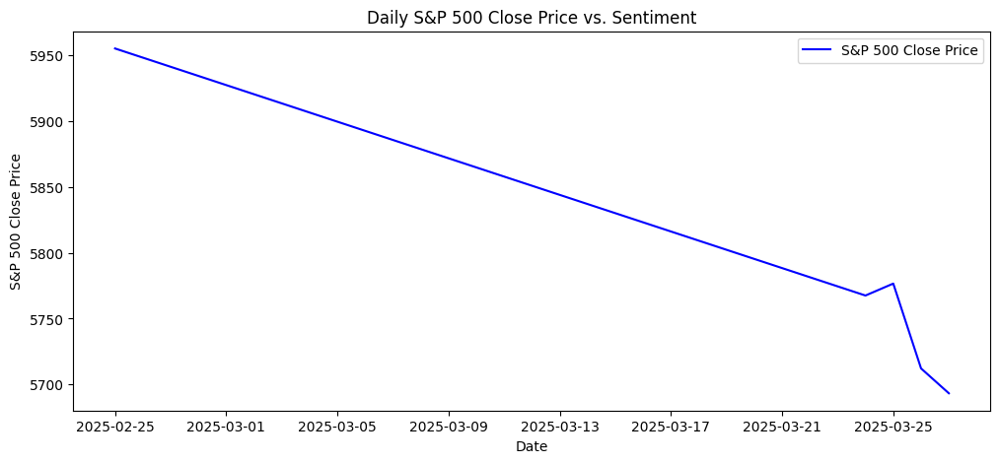

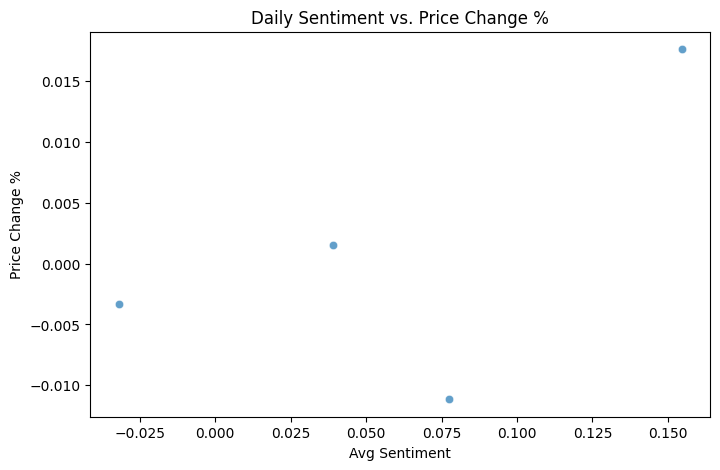

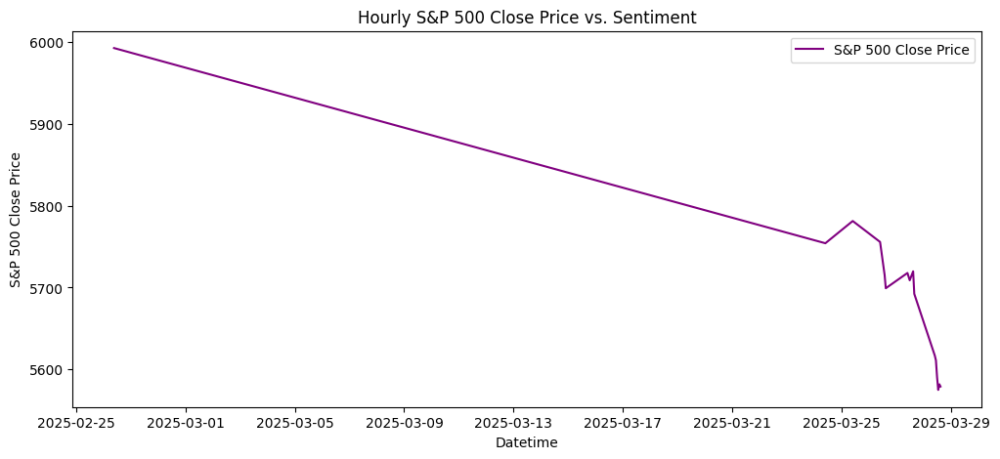

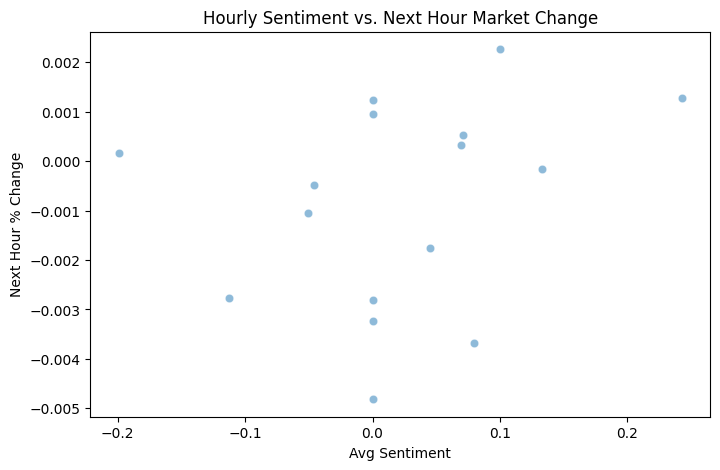

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Load daily and hourly merged data
daily_df = pd.read_csv("sentiment_vs_market_google.csv", index_col=0, parse_dates=True)
hourly_df = pd.read_csv("hourly_sentiment_vs_market_google.csv", index_col=0, parse_dates=True)

# Plot daily sentiment vs. market price
plt.figure(figsize=(12, 5))
plt.plot(daily_df.index, daily_df['Close'], label='S&P 500 Close Price', color='blue')
plt.xlabel("Date")
plt.ylabel("S&P 500 Close Price")
plt.title("Daily S&P 500 Close Price vs. Sentiment")
plt.legend()
plt.show()

# Scatter plot for daily sentiment vs. daily change
plt.figure(figsize=(8, 5))
sns.scatterplot(x=daily_df['Avg_Sentiment'], y=daily_df['Price Change %'], alpha=0.7)
plt.xlabel("Avg Sentiment")
plt.ylabel("Price Change %")
plt.title("Daily Sentiment vs. Price Change %")
plt.show()

# Plot hourly sentiment vs. market price
plt.figure(figsize=(12, 5))
plt.plot(hourly_df.index, hourly_df['Close'], label='S&P 500 Close Price', color='purple')
plt.xlabel("Datetime")
plt.ylabel("S&P 500 Close Price")
plt.title("Hourly S&P 500 Close Price vs. Sentiment")
plt.legend()
plt.show()

# Scatter plot for hourly sentiment vs. hourly change
plt.figure(figsize=(8, 5))
sns.scatterplot(x=hourly_df['Avg_Sentiment'], y=hourly_df['Next Hour Change %'], alpha=0.5)
plt.xlabel("Avg Sentiment")
plt.ylabel("Next Hour % Change")
plt.title("Hourly Sentiment vs. Next Hour Market Change")
plt.show()


# now lets do sentimental analysis of our scraped twitter data


In [16]:
import pandas as pd
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Initialize the sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

# Function to calculate sentiment score
def get_sentiment_score(text):
    # Use VADER to calculate sentiment score
    sentiment = analyzer.polarity_scores(text)
    return sentiment['compound']  # Compound score is the overall sentiment

# Load the scraped tweet data
scraped_tweet_df = pd.read_csv("scraped_tweet_data.csv")

# Calculate sentiment scores for scraped tweets
scraped_tweet_df['sentiment_score'] = scraped_tweet_df['content'].apply(lambda x: get_sentiment_score(str(x)))

# Save the sentiment results to a new CSV file
scraped_tweet_df.to_csv("scraped_tweet_data_with_sentiment.csv", index=False)

print("Sentiment analysis complete for scraped tweets. Results saved to 'scraped_tweet_data_with_sentiment.csv'.")


Sentiment analysis complete for scraped tweets. Results saved to 'scraped_tweet_data_with_sentiment.csv'.


# twtr sentiment analysis vs market

In [23]:
import pandas as pd
import yfinance as yf
from datetime import datetime, timedelta

# Get valid market data dates
end_date = datetime.now().strftime("%Y-%m-%d")
start_date = (datetime.now() - timedelta(days=59)).strftime("%Y-%m-%d")

# Download data
sp500 = yf.download(
    "^GSPC",
    start=start_date,
    end=end_date,
    interval="5m",
    prepost=True,
    auto_adjust=True
)

# Fix multi-index columns
if isinstance(sp500.columns, pd.MultiIndex):
    sp500.columns = sp500.columns.droplevel(0)  # Remove ticker level

# Rename columns to lowercase
sp500.columns = [col.lower() for col in sp500.columns]

# Verify
print("Cleaned columns:", sp500.columns.tolist())
print(sp500.head())

[*********************100%***********************]  1 of 1 completed

Cleaned columns: ['^gspc', '^gspc', '^gspc', '^gspc', '^gspc']
                                 ^gspc        ^gspc        ^gspc        ^gspc  \
Datetime                                                                        
2025-01-29 14:30:00+00:00  6052.709961  6061.259766  6051.970215  6057.700195   
2025-01-29 14:35:00+00:00  6053.560059  6055.120117  6048.939941  6053.080078   
2025-01-29 14:40:00+00:00  6048.080078  6055.759766  6046.020020  6053.810059   
2025-01-29 14:45:00+00:00  6048.709961  6053.490234  6045.839844  6047.899902   
2025-01-29 14:50:00+00:00  6054.569824  6056.259766  6047.470215  6048.879883   

                              ^gspc  
Datetime                             
2025-01-29 14:30:00+00:00         0  
2025-01-29 14:35:00+00:00  45828886  
2025-01-29 14:40:00+00:00  44889778  
2025-01-29 14:45:00+00:00  39876526  
2025-01-29 14:50:00+00:00  35318869  


-----------------------------------------DAILY CORRELATION-------------------------------

In [17]:
import pandas as pd
import yfinance as yf
from datetime import datetime, timedelta

# Load Sentiment Data for Scraped Tweets
tweet_sentiment_df = pd.read_csv("scraped_tweet_data_with_sentiment.csv")

# Convert timestamp to datetime format
tweet_sentiment_df["timestamp"] = pd.to_datetime(tweet_sentiment_df["timestamp"], utc=True)

# Get historical stock price data (S&P 500 as market indicator)
ticker = "^GSPC"  # S&P 500 index as an example
start_date = tweet_sentiment_df["timestamp"].min().strftime("%Y-%m-%d")
end_date = tweet_sentiment_df["timestamp"].max().strftime("%Y-%m-%d")

# Download stock data using yfinance
sp500_data = yf.download(ticker, start=start_date, end=end_date)

# Check the stock data
print(sp500_data.columns)

# Convert index to datetime
sp500_data.index = pd.to_datetime(sp500_data.index, utc=True)

# Calculate daily percentage change
sp500_data["Price Change %"] = sp500_data["Close"].pct_change() * 100  # Percentage change in stock price

# Aggregate tweet sentiment scores by date (mean sentiment per day)
sentiment_daily = tweet_sentiment_df.groupby(tweet_sentiment_df["timestamp"].dt.date)["sentiment_score"].mean()

# Convert sentiment_daily index to datetime format
sentiment_daily.index = pd.to_datetime(sentiment_daily.index, utc=True)

# Merge the sentiment data with the stock market data
# Flatten MultiIndex by resetting it for sp500_data
sp500_data = sp500_data.reset_index()

# Rename columns to remove MultiIndex if it exists
sp500_data.columns = ['Date'] + [col[0] for col in sp500_data.columns[1:]]

# Convert 'Date' to datetime and set as index for sp500_data
sp500_data["Date"] = pd.to_datetime(sp500_data["Date"]).dt.date
sp500_data.set_index("Date", inplace=True)

# Ensure sentiment data index is also in the correct format (datetime.date)
sentiment_daily.index = pd.to_datetime(sentiment_daily.index).date

# Merge the datasets on the 'Date' index
merged_df = pd.merge(sp500_data, sentiment_daily, left_index=True, right_index=True, how="inner")

# Compute correlation between sentiment and price changes
correlation = merged_df[["Close", "sentiment_score"]].corr()

# Display merged data and correlation results
print(merged_df.head())
print("Correlation between sentiment and market price change:")
print(correlation)

# Save the merged data and correlation results to a CSV file
merged_df.to_csv("sentiment_vs_market_tweets.csv")
print("Analysis saved to 'sentiment_vs_market_tweets.csv'")


[*********************100%***********************]  1 of 1 completed

MultiIndex([( 'Close', '^GSPC'),
            (  'High', '^GSPC'),
            (   'Low', '^GSPC'),
            (  'Open', '^GSPC'),
            ('Volume', '^GSPC')],
           names=['Price', 'Ticker'])
                  Close         High          Low         Open      Volume  \
2011-10-21  1238.250000  1239.030029  1215.390015  1215.390015  4980770000   
2012-01-26  1318.430054  1333.469971  1313.599976  1326.280029  4522070000   
2024-12-12  6051.250000  6079.680176  6051.250000  6074.290039  3678010000   
2025-01-03  5942.470215  5949.339844  5888.660156  5891.069824  3667340000   
2025-01-06  5975.379883  6021.040039  5960.009766  5982.810059  4940120000   

            Price Change %  sentiment_score  
2011-10-21             NaN           0.3939  
2012-01-26       -0.575389           0.0000  
2024-12-12       -0.541402           0.0000  
2025-01-03        1.259603           0.0000  
2025-01-06        0.553805           0.0000  
Correlation between sentiment and market price chan

---------------------------------------HOURLY CORRELATION----------------------------------

In [18]:
import pandas as pd
import yfinance as yf
from pandas.tseries.offsets import BDay
from datetime import datetime, time

# Load Sentiment Data for Scraped Tweets
tweet_sentiment_df = pd.read_csv("scraped_tweet_data_with_sentiment.csv")

# Convert to Eastern Time (market timezone)
tweet_sentiment_df["timestamp"] = pd.to_datetime(tweet_sentiment_df["timestamp"], utc=True).dt.tz_convert('America/New_York')

# Get market data for the last 60 days
ticker = "^GSPC"  # S&P 500 index as an example
end_date = datetime.now()  # Current date as the end date
start_date = end_date - pd.Timedelta(days=60)  # Limit to the last 60 days

# Get 1h data including pre/post-market
sp500_data = yf.download(ticker, start=start_date, end=end_date, interval='1h', prepost=True)

# Convert market data index to Eastern Time
sp500_data.index = sp500_data.index.tz_convert('America/New_York')

# Ensure correct column names if multi-indexed
if isinstance(sp500_data.columns, pd.MultiIndex):
    sp500_data.columns = sp500_data.columns.droplevel(1)  # Fix column names

# Define market hours
market_open = time(9, 30)
market_close = time(16, 0)

def adjust_sentiment_time(ts):
    """Shift after-hours sentiment to next market open"""
    ts = pd.Timestamp(ts).tz_convert('America/New_York')
    
    if (ts.time() > market_close) or (ts.time() < market_open) or (ts.weekday() >= 5):
        next_open = ts + BDay(1)
        return next_open.normalize() + pd.Timedelta(hours=9, minutes=30)
    elif ts.time() < market_open:
        return ts.normalize() + pd.Timedelta(hours=9, minutes=30)
    return ts

# Apply time adjustment to sentiment data
tweet_sentiment_df["Adjusted Hour"] = tweet_sentiment_df["timestamp"].apply(adjust_sentiment_time)

# Convert to proper timezone-aware datetime (FIXED)
tweet_sentiment_df["Adjusted Hour"] = pd.to_datetime(tweet_sentiment_df["Adjusted Hour"]).dt.tz_convert('America/New_York')

# Aggregate sentiment to adjusted hours
sentiment_hourly = tweet_sentiment_df.groupby(pd.Grouper(key="Adjusted Hour", freq='h'))["sentiment_score"].mean()

# Calculate price changes forward-looking (next hour)
sp500_data["Next Hour Change %"] = sp500_data["Close"].pct_change().shift(-1)

# Merge data using **nearest** timestamps to avoid NaNs
merged_df = pd.merge_asof(
    sp500_data[["Close", "Next Hour Change %"]].sort_index(),
    sentiment_hourly.sort_index(),
    left_index=True,
    right_index=True,
    direction="backward"
)

# Drop NaNs
merged_df.dropna(inplace=True)

# Filter to market hours only
merged_df.index = merged_df.index.tz_convert('America/New_York').tz_localize(None)
merged_df = merged_df.between_time(market_open, market_close)

# Calculate correlation
correlation = merged_df[["Next Hour Change %", "sentiment_score"]].corr()

# Sort in descending order (latest first)
merged_df = merged_df.sort_index(ascending=False)

# Print correlation and sample data
print("hourly_sentiment_vs_market_tweets:")
print(correlation)
print("\nSample Data:")
print(merged_df.head())

# Save results
merged_df.to_csv("hourly_sentiment_vs_market_tweets.csv")
print("Analysis saved to 'hourly_sentiment_vs_market_tweets.csv'")


[*********************100%***********************]  1 of 1 completed

hourly_sentiment_vs_market_tweets:
                    Next Hour Change %  sentiment_score
Next Hour Change %                 1.0              1.0
sentiment_score                    1.0              1.0

Sample Data:
                           Close  Next Hour Change %  sentiment_score
Datetime                                                             
2025-03-28 12:30:00  5575.049805            0.001225          0.38180
2025-03-27 09:30:00  5717.859863            0.000533          0.29295
Analysis saved to 'hourly_sentiment_vs_market_tweets.csv'


####

In [6]:
import time
import datetime
import pandas as pd
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
from webdriver_manager.chrome import ChromeDriverManager

# Setup Chrome driver options
chrome_options = Options()
chrome_options.add_argument("--disable-gpu")
chrome_options.add_argument("--window-size=1920,1080")
service = Service(ChromeDriverManager().install())
driver = webdriver.Chrome(service=service, options=chrome_options)

def scrape_stock_data(ticker):
    stock_url = f"https://finance.yahoo.com/quote/{ticker}"  # Change source if needed
    driver.get(stock_url)
    time.sleep(5)
    
    stock_data = []
    
    try:
        price = driver.find_element(By.XPATH, "//fin-streamer[@data-field='regularMarketPrice']").text
        change = driver.find_element(By.XPATH, "//fin-streamer[@data-field='regularMarketChange']").text
        percent_change = driver.find_element(By.XPATH, "//fin-streamer[@data-field='regularMarketChangePercent']").text
        timestamp = datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S")
        stock_data.append({"timestamp": timestamp, "ticker": ticker, "price": price, "change": change, "% change": percent_change})
    except:
        print(f"Failed to scrape data for {ticker}")
        return None
    
    return stock_data

def save_stock_data():
    ticker = input("Enter stock ticker symbol: ").strip().upper()
    stock_info = scrape_stock_data(ticker)
    
    if stock_info:
        df = pd.DataFrame(stock_info)
        df.to_csv(f"{ticker}_stock_data.csv", index=False)
        print(f"Stock data saved to ticker_stock_data.csv")
    else:
        print("No data to save.")

save_stock_data()
driver.quit()


Enter stock ticker symbol:  AAPL


Stock data saved to ticker_stock_data.csv


In [10]:
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options
from webdriver_manager.chrome import ChromeDriverManager
import time

chrome_options = Options()
chrome_options.add_argument("--disable-gpu")
chrome_options.add_argument("--window-size=1920,1080")
service = Service(ChromeDriverManager().install())
driver = webdriver.Chrome(service=service, options=chrome_options)

try:
    driver.get("https://www.google.com")
    time.sleep(3)
    print("Page title:", driver.title)
finally:
    driver.quit()


Page title: Google


In [12]:
import time
import datetime
from collections import Counter
import pandas as pd
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
from webdriver_manager.chrome import ChromeDriverManager
from plyer import notification

# Setup Chrome driver options
chrome_options = Options()
chrome_options.add_argument("--disable-gpu")
chrome_options.add_argument("--window-size=1920,1080")
chrome_options.add_argument("user-agent=Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/115.0.0.0 Safari/537.36")
service = Service(ChromeDriverManager().install())
driver = webdriver.Chrome(service=service, options=chrome_options)

# Define influential Twitter accounts and market keywords
influential_accounts = [
    "KobeissiLetter", "Barchart", "fxhedgers", "unusual_whales",
    "TaviCosta", "LynAldenContact", "macroalf", "SawyerMerritt",
    "WatcherGuru", "TheTerminal_", "StockMKTNewz", "leadlagreport",
    "GameofTrades_", "zerohedge", "charliebilello", "federalreserve", "Stocktwits"
]

market_keywords = [
    "stock market", "crash", "sell-off", "recession", "inflation",
    "interest rates", "liquidity", "quantitative tightening", "Federal Reserve",
    "volatility", "unemployment", "GDP", "housing market", "oil prices"
]

def send_desktop_notification(title, message):
    notification.notify(
        title=title,
        message=message,
        timeout=10
    )

# Scrape tweets from Twitter based on the search query
def scrape_twitter(query):
    twitter_url = f"https://twitter.com/search?q={query.replace(' ', '%20')}&src=typed_query&f=live"
    driver.get(twitter_url)
    # Increase sleep time to allow Twitter to load fully
    time.sleep(10)

    tweets_data = []
    last_height = driver.execute_script("return document.body.scrollHeight")
    scroll_attempts = 0
    start_time = datetime.datetime.now()
    timeout = 60

    while (datetime.datetime.now() - start_time).seconds < timeout:
        driver.execute_script("window.scrollBy(0, 2000);")
        time.sleep(2)
        tweets = driver.find_elements(By.CSS_SELECTOR, "article[data-testid='tweet']")

        for tweet in tweets:
            try:
                content = tweet.find_element(By.XPATH, ".//div[@lang]").text
                timestamp = tweet.find_element(By.XPATH, ".//time").get_attribute("datetime")
                tweets_data.append({"timestamp": timestamp, "content": content})
            except Exception as e:
                continue

        new_height = driver.execute_script("return document.body.scrollHeight")
        if new_height == last_height:
            scroll_attempts += 1
            if scroll_attempts >= 5:
                break
        else:
            scroll_attempts = 0
        last_height = new_height

    return tweets_data

# Function to save tweets data to a CSV file and perform sentiment analysis using VADER
def save_tweet_data():
    ticker = "AAPL"  # predefined ticker symbol

    all_tweets = []
    # Scrape tweets mentioning the ticker
    all_tweets.extend(scrape_twitter(ticker))
    
    # Scrape tweets from influential accounts about the ticker
    for account in influential_accounts:
        all_tweets.extend(scrape_twitter(f"from:{account} {ticker}"))
    
    # Save the scraped tweet data to a CSV file with a consistent name
    tweets_df = pd.DataFrame(all_tweets)
    tweets_df.to_csv("scraped_tweet_dataticker.csv", index=False)
    print("Tweet data saved to scraped_tweet_dataticker.csv")
    return all_tweets

# Function to detect keyword frequency from tweet data
def detect_keyword_frequency(tweets, keywords):
    all_text = " ".join([str(tweet["content"]) for tweet in tweets if isinstance(tweet["content"], str)])
    word_counts = Counter(all_text.lower().split())
    return {word: word_counts[word] for word in keywords if word in word_counts}

# Perform sentiment analysis using VADER
def analyze_sentiment(tweets):
    from nltk.sentiment.vader import SentimentIntensityAnalyzer
    import nltk
    nltk.download('vader_lexicon', quiet=True)
    
    analyzer = SentimentIntensityAnalyzer()
    sentiments = []
    for tweet in tweets:
        score = analyzer.polarity_scores(tweet["content"])
        sentiments.append({
            "timestamp": tweet["timestamp"],
            "content": tweet["content"],
            "neg": score["neg"],
            "neu": score["neu"],
            "pos": score["pos"],
            "compound": score["compound"]
        })
    sentiments_df = pd.DataFrame(sentiments)
    sentiments_df.to_csv("sentiment_analysisticker.csv", index=False)
    print("Sentiment analysis saved to sentiment_analysisticker.csv")

def monitor_market():
    tweets = save_tweet_data()

    # Load saved tweet data for keyword analysis using the same filename
    tweets_df = pd.read_csv("scraped_tweet_dataticker.csv")
    all_tweets = [{"timestamp": row["timestamp"], "content": row["content"]} for index, row in tweets_df.iterrows()]

    # Detect keyword frequency
    keyword_frequencies = detect_keyword_frequency(all_tweets, market_keywords)
    df = pd.DataFrame({"Keyword": list(keyword_frequencies.keys()), "Frequency": list(keyword_frequencies.values())})
    df.to_csv("twitter_market_sentiment_alertsticker.csv", index=False)
    
    if any(count >= 5 for count in keyword_frequencies.values()):
        send_desktop_notification("Market Alert!", str(keyword_frequencies))

    print("Data saved to twitter_market_sentiment_alertsticker.csv")
    print("Keyword Alerts:", keyword_frequencies)
    
    # Perform sentiment analysis
    if tweets:
        analyze_sentiment(tweets)

def main():
    monitor_market()
    driver.quit()

if __name__ == "__main__":
    main()


Tweet data saved to scraped_tweet_dataticker.csv
Data saved to twitter_market_sentiment_alertsticker.csv
Keyword Alerts: {}
Sentiment analysis saved to sentiment_analysisticker.csv


In [1]:
import pandas as pd
import yfinance as yf
from pandas.tseries.offsets import BDay
from datetime import datetime, time

# Load sentiment data for a specific ticker from your CSV file
sentiment_df = pd.read_csv("sentiment_analysisticker.csv")

# Convert the timestamp to datetime with UTC, then convert to Eastern Time (market timezone)
sentiment_df["timestamp"] = pd.to_datetime(sentiment_df["timestamp"], utc=True).dt.tz_convert('America/New_York')

# Use the 'compound' column as the sentiment score
sentiment_df = sentiment_df.rename(columns={"compound": "sentiment_score"})

# Get market data for the last 60 days for the specific ticker (e.g., AAPL)
ticker = "AAPL"  # Replace with your desired ticker symbol
end_date = datetime.now()  # Current date as the end date
start_date = end_date - pd.Timedelta(days=60)  # Limit to the last 60 days

# Get 1-hour interval data including pre/post-market using yfinance
ticker_data = yf.download(ticker, start=start_date, end=end_date, interval='1h', prepost=True)

# Convert the market data index to Eastern Time
ticker_data.index = ticker_data.index.tz_convert('America/New_York')

# If columns are multi-indexed, drop the extra level
if isinstance(ticker_data.columns, pd.MultiIndex):
    ticker_data.columns = ticker_data.columns.droplevel(1)

# Define market hours (Eastern Time)
market_open = time(9, 30)
market_close = time(16, 0)

def adjust_sentiment_time(ts):
    """Shift tweets outside market hours (or on weekends) to the next market open."""
    ts = pd.Timestamp(ts).tz_convert('America/New_York')
    if (ts.time() > market_close) or (ts.time() < market_open) or (ts.weekday() >= 5):
        # Add one business day and set to market open time
        next_open = ts + BDay(1)
        return next_open.normalize() + pd.Timedelta(hours=9, minutes=30)
    elif ts.time() < market_open:
        return ts.normalize() + pd.Timedelta(hours=9, minutes=30)
    return ts

# Apply the time adjustment to align tweets with market open sessions
sentiment_df["Adjusted Hour"] = sentiment_df["timestamp"].apply(adjust_sentiment_time)

# Ensure the adjusted timestamps are timezone-aware in Eastern Time
sentiment_df["Adjusted Hour"] = pd.to_datetime(sentiment_df["Adjusted Hour"]).dt.tz_convert('America/New_York')

# Aggregate sentiment to hourly frequency using the adjusted timestamps
sentiment_hourly = sentiment_df.groupby(pd.Grouper(key="Adjusted Hour", freq='h'))["sentiment_score"].mean()

# Calculate forward-looking price change (next hour percentage change) for the market data
ticker_data["Next Hour Change %"] = ticker_data["Close"].pct_change().shift(-1)

# Merge market data and aggregated sentiment using nearest timestamp matching (backward direction)
merged_df = pd.merge_asof(
    ticker_data[["Close", "Next Hour Change %"]].sort_index(),
    sentiment_hourly.sort_index(),
    left_index=True,
    right_index=True,
    direction="backward"
)

# Drop any NaN values from the merged data
merged_df.dropna(inplace=True)

# Filter merged data to include only records within standard market hours
merged_df.index = merged_df.index.tz_convert('America/New_York').tz_localize(None)
merged_df = merged_df.between_time(market_open, market_close)

# Calculate the correlation between the next hour market change and sentiment score
correlation = merged_df[["Next Hour Change %", "sentiment_score"]].corr()

# Sort the merged data in descending order (latest first)
merged_df = merged_df.sort_index(ascending=False)

# Print the correlation and sample data
print("Hourly Sentiment vs Market (Ticker-specific):")
print(correlation)
print("\nSample Data:")
print(merged_df.head())

# Save the merged data to a CSV file
merged_df.to_csv("hourly_sentiment_vs_market_ticker.csv")
print("Analysis saved to 'hourly_sentiment_vs_market_ticker.csv'")


YF.download() has changed argument auto_adjust default to True


[*********************100%***********************]  1 of 1 completed

Hourly Sentiment vs Market (Ticker-specific):
                    Next Hour Change %  sentiment_score
Next Hour Change %            1.000000         0.166689
sentiment_score               0.166689         1.000000

Sample Data:
                          Close  Next Hour Change %  sentiment_score
Datetime                                                            
2025-03-27 09:30:00  221.649994            0.005189          -0.5574
2025-03-26 09:30:00  224.074493           -0.001582           0.0000
2025-03-25 13:30:00  223.490005           -0.000313           0.0000
2025-03-21 14:30:00  215.309998            0.014166           0.2960
2025-03-21 13:30:00  214.669998            0.002981           0.5256
Analysis saved to 'hourly_sentiment_vs_market_ticker.csv'


# Note

ok so one thing i learned is that my twtr data is not highly correlated with market data, this could be due to many reasons as market works not on 100 percent efficiency as sentiment trends now may affect prices later on, hence showing effects in lag, this thus leads to a low correlation in live data, on the other hand google daily news data had much higher correlation due to the fcat that it is measured daily, hence avoiding the major noises as many large investors do not react to data suddenly but rather take their time and analyse their decisions, and as the news sources were also from reputed sorces we can see why they reflected high correlation with market data, this way we saved ourselves from a lot of noise and false sentiment scores in our data,,,

# Market Sentiment dashboard

-----------------------------FIRST RUN THIS TO MERGE ALL OUR DATA FROM GOOGLE AND TWITTER--------------------

C:\Users\chour\AppData\Local\Temp\ipykernel_1444\1093463628.py:49: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



C:\Users\chour\AppData\Local\Temp\ipykernel_1444\1093463628.py:49: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\chour\AppData\Local\Temp\ipykernel_1444\1093463628.py:50: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will c

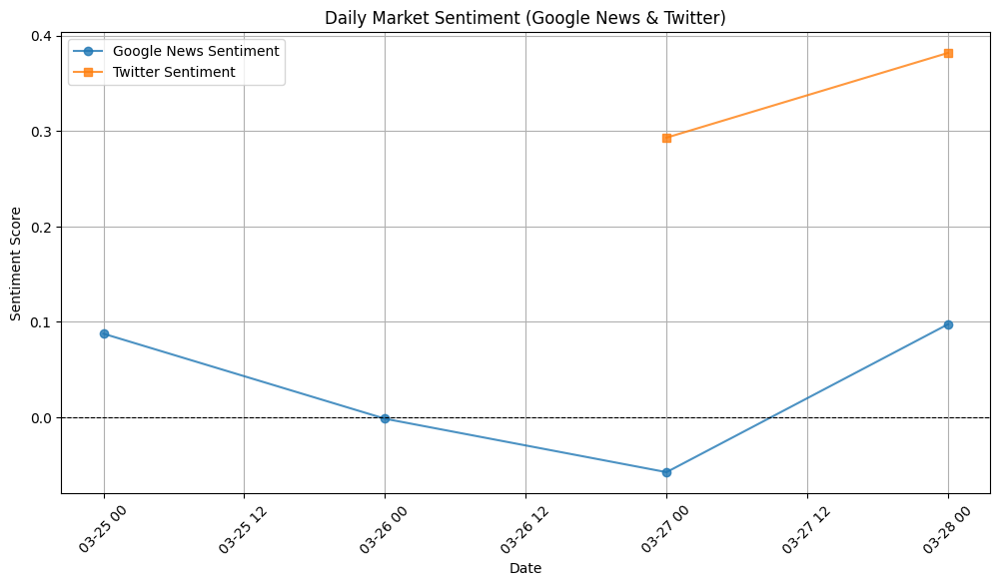

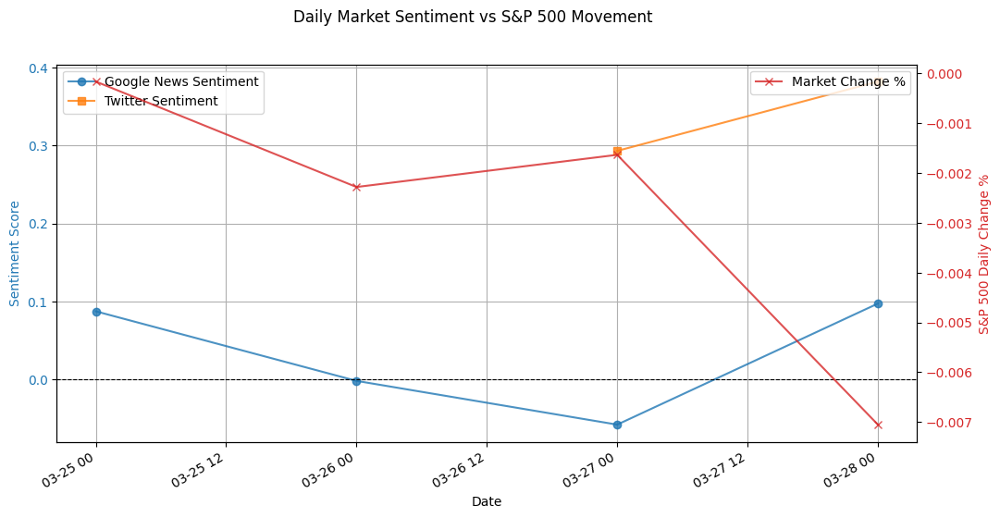

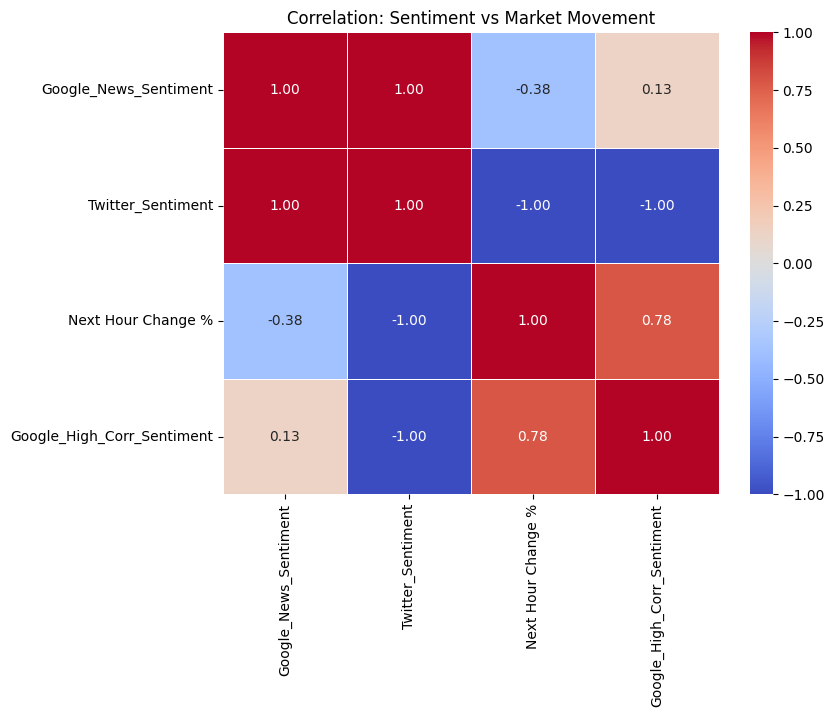

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# -------------------------------
# 1. Load All Data Files
# -------------------------------

# Use direct filenames since all files are in the same folder
google_news_sentiment = pd.read_csv("google_news_sentiment.csv")
# Convert "Published Date" to datetime
google_news_sentiment["Published Date"] = pd.to_datetime(google_news_sentiment["Published Date"], errors='coerce')

# Load Hourly Sentiment vs. Market Data for Google News
hourly_sentiment_vs_market_google = pd.read_csv("hourly_sentiment_vs_market_google.csv")
hourly_sentiment_vs_market_google["Datetime"] = pd.to_datetime(hourly_sentiment_vs_market_google["Datetime"], errors='coerce')
# Rename sentiment column for clarity
hourly_sentiment_vs_market_google.rename(columns={"Avg_Sentiment": "Google_News_Sentiment"}, inplace=True)

# Load Hourly Sentiment vs. Market Data for Twitter
hourly_sentiment_vs_market_tweets = pd.read_csv("hourly_sentiment_vs_market_tweets.csv")
hourly_sentiment_vs_market_tweets["Datetime"] = pd.to_datetime(hourly_sentiment_vs_market_tweets["Datetime"], errors='coerce')
# Rename sentiment column for clarity
hourly_sentiment_vs_market_tweets.rename(columns={"sentiment_score": "Twitter_Sentiment"}, inplace=True)

# Load Raw Tweet Data with Sentiment (if needed for further analysis)
scraped_tweet_sentiment = pd.read_csv("scraped_tweet_data_with_sentiment.csv")
scraped_tweet_sentiment["timestamp"] = pd.to_datetime(scraped_tweet_sentiment["timestamp"], errors='coerce')

# Load High-Correlation Google Sentiment vs. Market Data
# Assuming the first column is the date index. Parse dates and use that as index.
high_corr_google_sentiment = pd.read_csv("sentiment_vs_market_google.csv", index_col=0, parse_dates=True)
high_corr_google_sentiment.rename(columns={"Avg_Sentiment": "Google_High_Corr_Sentiment"}, inplace=True)

# -------------------------------
# 2. Merge Hourly Sentiment Data
# -------------------------------

# Merge the hourly sentiment from Google News and Twitter on the "Datetime" column (outer join)
merged_hourly_sentiment = pd.merge(hourly_sentiment_vs_market_google, 
                                   hourly_sentiment_vs_market_tweets[["Datetime", "Twitter_Sentiment"]],
                                   on="Datetime", 
                                   how="outer")

# Sort by Datetime for consistency
merged_hourly_sentiment = merged_hourly_sentiment.sort_values(by="Datetime")

# Fill missing market data ("Close" and "Next Hour Change %") with forward then backward fill
merged_hourly_sentiment["Close"].fillna(method="ffill", inplace=True)
merged_hourly_sentiment["Close"].fillna(method="bfill", inplace=True)
merged_hourly_sentiment["Next Hour Change %"].fillna(method="ffill", inplace=True)
merged_hourly_sentiment["Next Hour Change %"].fillna(method="bfill", inplace=True)

# -------------------------------
# 3. Aggregate Daily Sentiment Data
# -------------------------------

# Create a Date column from the Datetime column
merged_hourly_sentiment["Date"] = merged_hourly_sentiment["Datetime"].dt.date

# Aggregate daily values:
# - For sentiment: take the mean of Google News and Twitter sentiments
# - For market: take the last closing price and sum the next hour % change as a proxy for daily change
daily_sentiment = merged_hourly_sentiment.groupby("Date").agg({
    "Google_News_Sentiment": "mean",
    "Twitter_Sentiment": "mean",
    "Close": "last",
    "Next Hour Change %": "sum"
}).reset_index()

# Ensure the Date column is in datetime format
daily_sentiment["Date"] = pd.to_datetime(daily_sentiment["Date"])

# -------------------------------
# 4. Merge with High-Correlation Google Sentiment Data
# -------------------------------

# Merge the high-correlation Google sentiment into our daily data using the Date as key.
daily_sentiment_merged = daily_sentiment.merge(
    high_corr_google_sentiment[["Google_High_Corr_Sentiment"]],
    left_on="Date", 
    right_index=True, 
    how="left"
)

# Fill any remaining missing values for high-correlation sentiment
daily_sentiment_merged["Google_High_Corr_Sentiment"].fillna(method="ffill", inplace=True)
daily_sentiment_merged["Google_High_Corr_Sentiment"].fillna(method="bfill", inplace=True)

# Optional: Save merged daily sentiment data to CSV for later use
daily_sentiment_merged.to_csv("daily_sentiment_merged.csv", index=False)

# -------------------------------
# 5. Visualizations
# -------------------------------

# (A) Daily Sentiment Trends: Google News & Twitter
plt.figure(figsize=(12, 6))
plt.plot(daily_sentiment_merged["Date"], daily_sentiment_merged["Google_News_Sentiment"], 
         label="Google News Sentiment", marker='o', linestyle='-', alpha=0.8)
plt.plot(daily_sentiment_merged["Date"], daily_sentiment_merged["Twitter_Sentiment"], 
         label="Twitter Sentiment", marker='s', linestyle='-', alpha=0.8)
plt.axhline(0, color="black", linestyle="--", linewidth=0.8)
plt.xlabel("Date")
plt.ylabel("Sentiment Score")
plt.title("Daily Market Sentiment (Google News & Twitter)")
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

# (B) Dual-Axis Plot: Sentiment vs. Market Movement (S&P 500)
fig, ax1 = plt.subplots(figsize=(12, 6))

# Left y-axis for sentiment scores
ax1.set_xlabel("Date")
ax1.set_ylabel("Sentiment Score", color="tab:blue")
ax1.plot(daily_sentiment_merged["Date"], daily_sentiment_merged["Google_News_Sentiment"], 
         label="Google News Sentiment", color="tab:blue", marker='o', alpha=0.8)
ax1.plot(daily_sentiment_merged["Date"], daily_sentiment_merged["Twitter_Sentiment"], 
         label="Twitter Sentiment", color="tab:orange", marker='s', alpha=0.8)
ax1.tick_params(axis='y', labelcolor="tab:blue")
ax1.axhline(0, color="black", linestyle="--", linewidth=0.8)

# Right y-axis for market change (Next Hour Change %)
ax2 = ax1.twinx()
ax2.set_ylabel("S&P 500 Daily Change %", color="tab:red")
ax2.plot(daily_sentiment_merged["Date"], daily_sentiment_merged["Next Hour Change %"], 
         label="Market Change %", color="tab:red", marker='x', alpha=0.8)
ax2.tick_params(axis='y', labelcolor="tab:red")

fig.suptitle("Daily Market Sentiment vs S&P 500 Movement")
ax1.legend(loc="upper left")
ax2.legend(loc="upper right")
fig.autofmt_xdate()
ax1.grid(True)
plt.show()

# (C) Correlation Heatmap: Sentiments & Market Movement
corr_matrix = daily_sentiment_merged[["Google_News_Sentiment", "Twitter_Sentiment", 
                                        "Next Hour Change %", "Google_High_Corr_Sentiment"]].corr()
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation: Sentiment vs Market Movement")
plt.show()


#using Plotly for more interactive dashboard

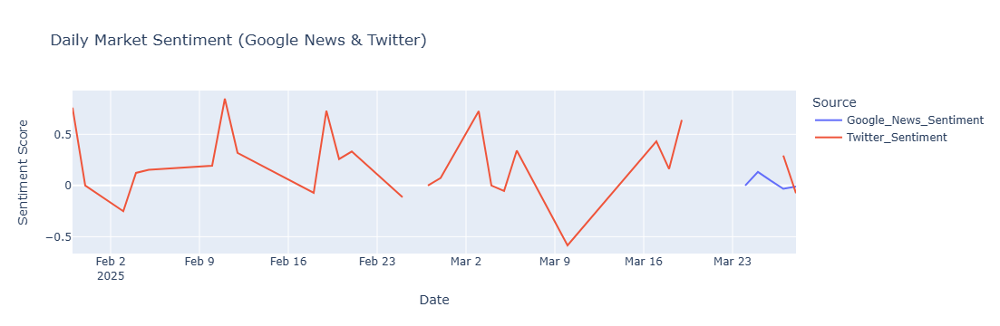

In [7]:
import plotly.express as px
import plotly.graph_objects as go

# Assuming daily_sentiment_merged is your merged dataframe
fig = px.line(daily_sentiment_merged, x="Date", y=["Google_News_Sentiment", "Twitter_Sentiment"],
              labels={"value": "Sentiment Score", "variable": "Source"},
              title="Daily Market Sentiment (Google News & Twitter)")
fig.update_layout(xaxis_title="Date", yaxis_title="Sentiment Score")
fig.show()


-------------------------------------# THE MOST INTERACTIVE DASHBOARD WITH PLOTLY---------------------------

In [5]:
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd

# -------------------------------
# 1. Load the Merged Data
# -------------------------------
# Ensure daily_sentiment_merged.csv is in the same folder as your script/notebook.
daily_sentiment_merged = pd.read_csv("daily_sentiment_merged.csv")
daily_sentiment_merged["Date"] = pd.to_datetime(daily_sentiment_merged["Date"])

# -------------------------------
# 2. Create the Dash App Layout
# -------------------------------
app = dash.Dash(__name__)

app.layout = html.Div([
    html.H1("Market Sentiment Dashboard"),
    html.Div([
        html.Label("Select Date Range:"),
        dcc.DatePickerRange(
            id="date-picker",
            min_date_allowed=daily_sentiment_merged["Date"].min().date(),
            max_date_allowed=daily_sentiment_merged["Date"].max().date(),
            start_date=daily_sentiment_merged["Date"].min().date(),
            end_date=daily_sentiment_merged["Date"].max().date()
        )
    ], style={"margin": "20px"}),

    dcc.Graph(id="sentiment-trend"),
    dcc.Graph(id="dual-axis-plot"),
    dcc.Graph(id="scatter-plot"),
    dcc.Graph(id="sentiment-histogram"),
    dcc.Graph(id="heatmap")
])

# -------------------------------
# 3. Callback to Update Graphs
# -------------------------------
@app.callback(
    [Output("sentiment-trend", "figure"),
     Output("dual-axis-plot", "figure"),
     Output("scatter-plot", "figure"),
     Output("sentiment-histogram", "figure"),
     Output("heatmap", "figure")],
    [Input("date-picker", "start_date"),
     Input("date-picker", "end_date")]
)
def update_graphs(start_date, end_date):
    # Filter the dataframe based on selected date range
    mask = (daily_sentiment_merged["Date"] >= start_date) & (daily_sentiment_merged["Date"] <= end_date)
    filtered_df = daily_sentiment_merged.loc[mask]
    
    # --- Graph A: Daily Sentiment Trends ---
    fig1 = go.Figure()
    fig1.add_trace(go.Scatter(
        x=filtered_df["Date"],
        y=filtered_df["Google_News_Sentiment"],
        mode='lines+markers',
        name='Google News Sentiment',
        line=dict(color='blue')
    ))
    fig1.add_trace(go.Scatter(
        x=filtered_df["Date"],
        y=filtered_df["Twitter_Sentiment"],
        mode='lines+markers',
        name='Twitter Sentiment',
        line=dict(color='orange')
    ))
    fig1.update_layout(
        title="Daily Sentiment Trends",
        xaxis_title="Date",
        yaxis_title="Sentiment Score",
        hovermode="x unified"
    )
    
    # --- Graph B: Dual-Axis Plot: Sentiment vs. Market Movement ---
    fig2 = go.Figure()
    fig2.add_trace(go.Scatter(
        x=filtered_df["Date"],
        y=filtered_df["Google_News_Sentiment"],
        mode='lines+markers',
        name='Google News Sentiment',
        line=dict(color='blue')
    ))
    fig2.add_trace(go.Scatter(
        x=filtered_df["Date"],
        y=filtered_df["Twitter_Sentiment"],
        mode='lines+markers',
        name='Twitter Sentiment',
        line=dict(color='orange')
    ))
    fig2.add_trace(go.Scatter(
        x=filtered_df["Date"],
        y=filtered_df["Next Hour Change %"],
        mode='lines+markers',
        name='Market Change %',
        line=dict(color='red'),
        yaxis="y2"
    ))
    fig2.update_layout(
        title="Daily Sentiment vs. Market Movement",
        xaxis_title="Date",
        yaxis=dict(title="Sentiment Score", titlefont=dict(color="blue"), tickfont=dict(color="blue")),
        yaxis2=dict(title="Market Change %", overlaying="y", side="right", 
                    titlefont=dict(color="red"), tickfont=dict(color="red")),
        hovermode="x unified"
    )
    
    # --- Graph C: Scatter Plot: Google_High_Corr_Sentiment vs. Market Change ---
    fig3 = go.Figure()
    fig3.add_trace(go.Scatter(
        x=filtered_df["Google_High_Corr_Sentiment"],
        y=filtered_df["Next Hour Change %"],
        mode='markers',
        marker=dict(color='green', size=10),
        name="Google_High_Corr_Sentiment vs Market Change"
    ))
    fig3.update_layout(
        title="Scatter Plot: Google_High_Corr_Sentiment vs. Market Change %",
        xaxis_title="Google_High_Corr_Sentiment",
        yaxis_title="Market Change %",
        hovermode="closest"
    )
    
    # --- Graph D: Histogram: Distribution of Sentiment Scores ---
    fig4 = go.Figure()
    fig4.add_trace(go.Histogram(
        x=filtered_df["Google_News_Sentiment"],
        nbinsx=20,
        name="Google News Sentiment",
        marker_color='blue',
        opacity=0.7
    ))
    fig4.add_trace(go.Histogram(
        x=filtered_df["Twitter_Sentiment"],
        nbinsx=20,
        name="Twitter Sentiment",
        marker_color='orange',
        opacity=0.7
    ))
    fig4.update_layout(
        title="Histogram: Sentiment Score Distributions",
        xaxis_title="Sentiment Score",
        yaxis_title="Count",
        barmode="overlay",
        hovermode="closest"
    )
    
    # --- Graph E: Correlation Heatmap ---
    # Compute the correlation matrix for selected columns
    corr_cols = ["Google_News_Sentiment", "Twitter_Sentiment", "Next Hour Change %", "Google_High_Corr_Sentiment"]
    corr_matrix = filtered_df[corr_cols].corr()
    fig5 = px.imshow(corr_matrix,
                     text_auto=True,
                     color_continuous_scale='RdBu',
                     title="Correlation Heatmap: Sentiment vs Market Movement")
    fig5.update_layout(hovermode="closest")
    
    return fig1, fig2, fig3, fig4, fig5

# -------------------------------
# 4. Run the Dash App
# -------------------------------
if __name__ == '__main__':
    app.run(debug=True)


# SEC fillings based Alert system

In [6]:
import pandas as pd
df = pd.read_csv('sec_earnings_transcripts.csv')
print(df.columns.tolist())

['2025-04-02 01:56:25', '0000320193', 'us-gaap', 'AccountsPayable', "{'USD': [{'end': '2008-09-27', 'val': 5520000000, 'accn': '0001193125-09-153165', 'fy': 2009, 'fp': 'Q3', 'form': '10-Q', 'filed': '2009-07-22', 'frame': 'CY2008Q3I'}, {'end': '2009-06-27', 'val': 4854000000, 'accn': '0001193125-09-153165', 'fy': 2009, 'fp': 'Q3', 'form': '10-Q', 'filed': '2009-07-22', 'frame': 'CY2009Q2I'}]}", 'Unnamed: 5', "{'USD': [{'end': '2008-09-27', 'val': 5520000000, 'accn': '0001193125-09-153165', 'fy': 2009, 'fp': 'Q3', 'form': '10-Q', 'filed': '2009-07-22', 'frame': 'CY2008Q3I'}, {'end': '2009-06-27', 'val': 4854000000, 'accn': '0001193125-09-153165', 'fy': 2009, 'fp': 'Q3', 'form': '10-Q', 'filed': '2009-07-22', 'frame': 'CY2009Q2I'}]}.1"]


In [7]:
import pandas as pd

file_path = "sec_earnings_transcripts.csv"  # Your uploaded file path
df = pd.read_csv(file_path)

print(df.head())  # Display first few rows
print(df.columns)  # Print column names


   2025-04-02 01:56:25  0000320193  us-gaap               AccountsPayable  \
0  2025-04-02 01:56:25      320193  us-gaap        AccountsPayableCurrent   
1  2025-04-02 01:56:25      320193  us-gaap  AccountsReceivableNetCurrent   
2  2025-04-02 01:56:25      320193  us-gaap     AccruedIncomeTaxesCurrent   
3  2025-04-02 01:56:25      320193  us-gaap  AccruedIncomeTaxesNoncurrent   
4  2025-04-02 01:56:25      320193  us-gaap            AccruedLiabilities   

  {'USD': [{'end': '2008-09-27', 'val': 5520000000, 'accn': '0001193125-09-153165', 'fy': 2009, 'fp': 'Q3', 'form': '10-Q', 'filed': '2009-07-22', 'frame': 'CY2008Q3I'}, {'end': '2009-06-27', 'val': 4854000000, 'accn': '0001193125-09-153165', 'fy': 2009, 'fp': 'Q3', 'form': '10-Q', 'filed': '2009-07-22', 'frame': 'CY2009Q2I'}]}  \
0  {'USD': [{'end': '2008-09-27', 'val': 55200000...                                                                                                                                                        

In [2]:
import pandas as pd
import ast
import numpy as np

# Optimized Configuration using Percentiles
RISK_CONFIG = {
    'value_thresholds': {
        'default': 4_886_000_000,  # 75th %ile
        'AccountsPayable': 8_000_000_000,
        'Revenue': 15_000_000_000,
        'Cash': 5_000_000_000
    },
    
    'drop_thresholds': {
        'min_quarters': 3,  # Require 3 consecutive drops
        'pct_drop': 0.5,    # 50% drop from baseline
        'min_abs_drop': 1_000_000_000  # $1B minimum
    },
    
    'negative_value': {
        'lower_bound': -1_000_000_000,  # Ignore values < -$1B as data errors
        'whitelist': ['TaxAssets', 'DeferredRevenue']
    }
}

# Load data
df = pd.read_csv("sec_earnings_transcripts.csv", 
                header=None,
                names=['Timestamp', 'CIK', 'Taxonomy', 'Account',
                       'USD_Data1', 'Unnamed', 'USD_Data2'])

# Historical tracking with trend analysis
history = {}

def analyze_risks(row):
    try:
        account = row['Account']
        data = ast.literal_eval(row['USD_Data1'])
        values = [item['val'] for item in data['USD']]
        
        if not values:
            return None
            
        current_val = values[-1]
        key = (row['CIK'], account)
        prev_vals = history.get(key, [])
        
        alerts = []
        
        # 1. High Value Check
        threshold = RISK_CONFIG['value_thresholds'].get(account, RISK_CONFIG['value_thresholds']['default'])
        if current_val > threshold:
            alerts.append(f'high_value (${current_val/1e9:.1f}B > ${threshold/1e9:.1f}B)')
            
        # 2. Valid Negative Value Check
        if (current_val < RISK_CONFIG['negative_value']['lower_bound'] or 
            (current_val < 0 and account not in RISK_CONFIG['negative_value']['whitelist'])):
            alerts.append(f'invalid_negative (${current_val/1e6:.1f}M)')
            
        # 3. Significant Drop Analysis
        if len(prev_vals) >= RISK_CONFIG['drop_thresholds']['min_quarters']:
            baseline = np.mean(prev_vals[:-RISK_CONFIG['drop_thresholds']['min_quarters']])
            current_avg = np.mean(prev_vals[-RISK_CONFIG['drop_thresholds']['min_quarters']:])
            
            pct_drop = (baseline - current_avg)/baseline if baseline != 0 else 0
            abs_drop = baseline - current_avg
            
            if (pct_drop >= RISK_CONFIG['drop_thresholds']['pct_drop'] and 
                abs_drop >= RISK_CONFIG['drop_thresholds']['min_abs_drop']):
                alerts.append(f'sustained_drop ({pct_drop:.0%} over {RISK_CONFIG["drop_thresholds"]["min_quarters"]}q)')
        
        # Update history (keep 8 quarters)
        history[key] = (prev_vals + [current_val])[-8:]
        
        return {
            'CIK': row['CIK'],
            'Account': account,
            'Value': current_val,
            'Alerts': ' | '.join(alerts) if alerts else None
        }
        
    except Exception as e:
        return {'CIK': row['CIK'], 'Error': str(e), 'Alerts': None}

# Process and filter
results = df.apply(analyze_risks, axis=1)
alerts_df = pd.DataFrame([r for r in results if r and r.get('Alerts')])

print(f"Final Alert Count: {len(alerts_df)}")
print("Alert Distribution:")
print(alerts_df['Alerts'].value_counts().head(10))

alerts_df.to_csv("strategic_sec_alerts.csv", index=False)        #  okk whatever this wil be the final code

Final Alert Count: 7927
Alert Distribution:
Alerts
high_value ($5.0B > $4.9B)    76
invalid_negative ($-1.0M)     56
high_value ($5.1B > $4.9B)    53
invalid_negative ($-2.0M)     51
high_value ($5.5B > $4.9B)    51
high_value ($6.3B > $4.9B)    47
high_value ($6.2B > $4.9B)    47
high_value ($6.0B > $4.9B)    45
high_value ($5.2B > $4.9B)    43
high_value ($6.1B > $4.9B)    43
Name: count, dtype: int64


In [9]:
# simplified_visualization.py
import pandas as pd
import plotly.express as px
from dash import Dash, dcc, html, Input, Output

# Load and clean data
alerts = pd.read_csv("strategic_sec_alerts.csv")
alerts['Value'] = pd.to_numeric(alerts['Value'], errors='coerce').dropna()

# 1. Value Distribution (Violin Plot)
violin_fig = px.violin(alerts,
                      y='Value',
                      box=True,
                      title='Financial Value Distribution',
                      hover_data=['Account', 'CIK'],
                      log_y=True)

# 2. Account-wise Alert Count (Bar Chart)
#bar_fig = px.bar(alerts['Account'].value_counts().reset_index(),
 #              x='Account',
  #             y='count',
   #            title='Alerts by Account Type',
    #           labels={'count': 'Number of Alerts'},
     #          color='Account')

# 3. Alert Type Breakdown (Pie Chart)
pie_fig = px.pie(alerts['Alerts'].value_counts().reset_index(),
                names='Alerts',
                values='count',
                title='Alert Type Distribution',
                hole=0.3)

# Create dashboard
app = Dash(__name__)

app.layout = html.Div([
    html.H1("SEC Risk Alert Dashboard", style={'textAlign': 'center', 'padding': '20px'}),
    
    html.Div([
        dcc.Graph(figure=violin_fig, style={'width': '80%', 'display': 'inline-block'}),
        dcc.Graph(figure=bar_fig, style={'width': '80%', 'display': 'inline-block'})
    ]),
    
    html.Div([
        dcc.Graph(figure=pie_fig, style={'height': '700px'})
    ]),
    
    html.Div([
        dcc.Dropdown(
            id='account-filter',
            options=[{'label': acc, 'value': acc} for acc in alerts['Account'].unique()],
            value=alerts['Account'].iloc[0],
            clearable=False,
            style={'width': '60%', 'margin': '20px auto'}
        ),
        dcc.Graph(id='account-details')
    ])
])

@app.callback(
    Output('account-details', 'figure'),
    Input('account-filter', 'value')
)
def update_account_view(selected_account):
    filtered = alerts[alerts['Account'] == selected_account]
    return px.scatter(filtered,
                    x='Value',
                    y='Alerts',
                    color='Alerts',
                    size='Value',
                    title=f'{selected_account} - Detailed View',
                    hover_data=['CIK'])

if __name__ == '__main__':
    app.run(debug=True, port=8051)

# Macro Data Analysis for measuring the health of economy

In [2]:
import pandas as pd
import pandas_datareader.data as web
import datetime

FRED_API_KEY = '5c52774c0b67b60a452745a9eb370165'  # Get from FRED website

# Expanded list of 50+ key macroeconomic indicators
MACRO_SERIES = {
    # GDP and Components
    'GDP': 'GDP',
    'GDPC1': 'GDPC1',  # Real GDP
    'GDPPOT': 'GDPPOT',  # Potential GDP
    'PCEC': 'PCEC',  # Personal Consumption Expenditures
    
    # Employment
    'UNRATE': 'UNRATE',  # Unemployment Rate
    'PAYEMS': 'PAYEMS',  # Nonfarm Payrolls
    'CE16OV': 'CE16OV',  # Civilian Employment
    'U6RATE': 'U6RATE',  # Underemployment Rate
    
    # Inflation
    'CPIAUCSL': 'CPIAUCSL',  # CPI All Items
    'PCEPI': 'PCEPI',  # PCE Price Index
    'PPIACO': 'PPIACO',  # Producer Price Index
    
    # Interest Rates
    'FEDFUNDS': 'FEDFUNDS',  # Federal Funds Rate
    'DGS10': 'DGS10',  # 10-Year Treasury Yield
    'DGS2': 'DGS2',  # 2-Year Treasury Yield
    
    # Housing
    'HOUST': 'HOUST',  # Housing Starts
    'CSUSHPINSA': 'CSUSHPINSA',  # Case-Shiller Home Price Index
    'MSPUS': 'MSPUS',  # Median Sales Price of Houses
    
    # Manufacturing
    'INDPRO': 'INDPRO',  # Industrial Production
    'TCU': 'TCU',  # Capacity Utilization
    'NEWORDER': 'NEWORDER',  # Manufacturers' New Orders
    
    # Consumer
    'RRSFS': 'RRSFS',  # Retail Sales
    'UMCSENT': 'UMCSENT',  # Consumer Sentiment
    
    # Trade
    'BOPGSTB': 'BOPGSTB',  # Trade Balance
    'EXPGS': 'EXPGS',  # Exports
    'IMPGS': 'IMPGS',  # Imports
    
    # Financial Markets
    'DJIA': 'DJIA',  # Dow Jones
    'SP500': 'SP500',  # S&P 500
    'VIXCLS': 'VIXCLS',  # VIX Index
    
    # Commodities
    'DCOILWTICO': 'DCOILWTICO',  # Oil Prices
    'GOLDAMGBD228NLBM': 'GOLDAMGBD228NLBM',  # Gold Prices
    
    # Government Finance
    'FYFSD': 'FYFSD',  # Federal Surplus/Deficit
    'GFDEBTN': 'GFDEBTN',  # Federal Debt
    
    # Banking
    'TOTCI': 'TOTCI',  # Commercial & Industrial Loans
    'M2SL': 'M2SL',  # Money Supply M2
    
    # International
    'DTWEXBGS': 'DTWEXBGS',  # US Dollar Index
    'DEXUSEU': 'DEXUSEU',  # USD/EUR Exchange Rate
    'DEXCHUS': 'DEXCHUS',  # USD/CNY Exchange Rate
    
    # Leading Indicators
    'USSLIND': 'USSLIND',  # Leading Economic Index
    'T10Y2Y': 'T10Y2Y',  # 10Y-2Y Yield Spread
}

def fetch_fred_data(series_dict, start_date='1970-01-01'):
    """Fetch macroeconomic data from FRED with error handling"""
    end_date = datetime.datetime.now().strftime('%Y-%m-%d')
    df = pd.DataFrame()
    fetched_series = []
    
    for name, code in series_dict.items():
        try:
            series = web.DataReader(code, 'fred', start_date, end_date)
            if not series.empty:
                # Resample to monthly and forward fill missing values
                series = series.resample('M').last().ffill()
                df = pd.concat([df, series], axis=1)
                fetched_series.append((name, code))
                print(f" Success: {name} ({code})")
            else:
                print(f" Empty data: {name} ({code})")
        except Exception as e:
            print(f" Failed: {name} ({code}) - {str(e)}")
    
    # Create meaningful column names from fetched series only
    df.columns = [f"{name}_{code}" for name, code in fetched_series]
    
    # Forward fill missing values and drop remaining NAs
    return df.ffill().dropna()

def save_macro_data(file_name='macro_data.csv'):
    """Save macro data to CSV with progress tracking"""
    print(" Fetching macroeconomic data from FRED...")
    macro_df = fetch_fred_data(MACRO_SERIES)
    
    # Add derived metrics
    macro_df['GDP_Growth_QoQ'] = macro_df['GDP_GDP'].pct_change(periods=1) * 100
    macro_df['CPI_YoY'] = macro_df['CPIAUCSL_CPIAUCSL'].pct_change(periods=12) * 100
    
    # Save to CSV
    macro_df.to_csv(file_name)
    
    print(f"\n Successfully saved {len(macro_df.columns)} indicators")
    print(f" Date Range: {macro_df.index.min()} to {macro_df.index.max()}")
    print(f" Total Series: {len(macro_df.columns)}")
    print(f"💾File saved as: {file_name}")

if __name__ == '__main__':
    save_macro_data()

 Fetching macroeconomic data from FRED...


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: GDP (GDP)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: GDPC1 (GDPC1)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: GDPPOT (GDPPOT)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: PCEC (PCEC)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: UNRATE (UNRATE)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: PAYEMS (PAYEMS)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: CE16OV (CE16OV)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: U6RATE (U6RATE)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: CPIAUCSL (CPIAUCSL)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: PCEPI (PCEPI)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: PPIACO (PPIACO)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: FEDFUNDS (FEDFUNDS)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: DGS10 (DGS10)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: DGS2 (DGS2)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: HOUST (HOUST)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: CSUSHPINSA (CSUSHPINSA)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: MSPUS (MSPUS)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: INDPRO (INDPRO)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: TCU (TCU)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: NEWORDER (NEWORDER)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: RRSFS (RRSFS)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: UMCSENT (UMCSENT)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: BOPGSTB (BOPGSTB)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: EXPGS (EXPGS)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: IMPGS (IMPGS)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: DJIA (DJIA)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: SP500 (SP500)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: VIXCLS (VIXCLS)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: DCOILWTICO (DCOILWTICO)
 Failed: GOLDAMGBD228NLBM (GOLDAMGBD228NLBM) - Unable to read URL: https://fred.stlouisfed.org/graph/fredgraph.csv?id=GOLDAMGBD228NLBM
Response Text:
b'<!DOCTYPE html>\r\n<html lang="en">\r\n<head>\r\n    <meta charset="utf-8">\r\n    <meta http-equiv="X-UA-Compatible" content="IE=edge">\r\n    <meta name="viewport" content="width=device-width, initial-scale=1">\r\n    <title>Error - St. Louis Fed</title>\r\n    <meta name="description" content="">\r\n    <meta name="keywords" content="">    \r\n    <link rel="stylesheet" type="text/css" href="/assets/bootstrap/dist/css/bootstrap.min.css">\r\n    <link rel="stylesheet" type="text/css" href="/css/home.min.css?1553087253">\r\n    <link rel="stylesheet" type="text/css" href="/assets/fontawesome-free/css/all.min.css">\r\n    <link rel="stylesheet" type="text/css" href="/assets/select2/dist/css/select2.min.css">\r\n    <style>p {\r\n        margin-bottom: 1.5em;\r\n    }</style>\r\n</head>\r\n<body>\r\n<lin

C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: FYFSD (FYFSD)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: GFDEBTN (GFDEBTN)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: TOTCI (TOTCI)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: M2SL (M2SL)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: DTWEXBGS (DTWEXBGS)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: DEXUSEU (DEXUSEU)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: DEXCHUS (DEXCHUS)


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


 Success: USSLIND (USSLIND)
 Success: T10Y2Y (T10Y2Y)

 Successfully saved 40 indicators
 Date Range: 2015-04-30 00:00:00 to 2025-04-30 00:00:00
 Total Series: 40
💾File saved as: macro_data.csv


C:\Users\chour\AppData\Local\Temp\ipykernel_7460\1877496663.py:88: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  series = series.resample('M').last().ffill()


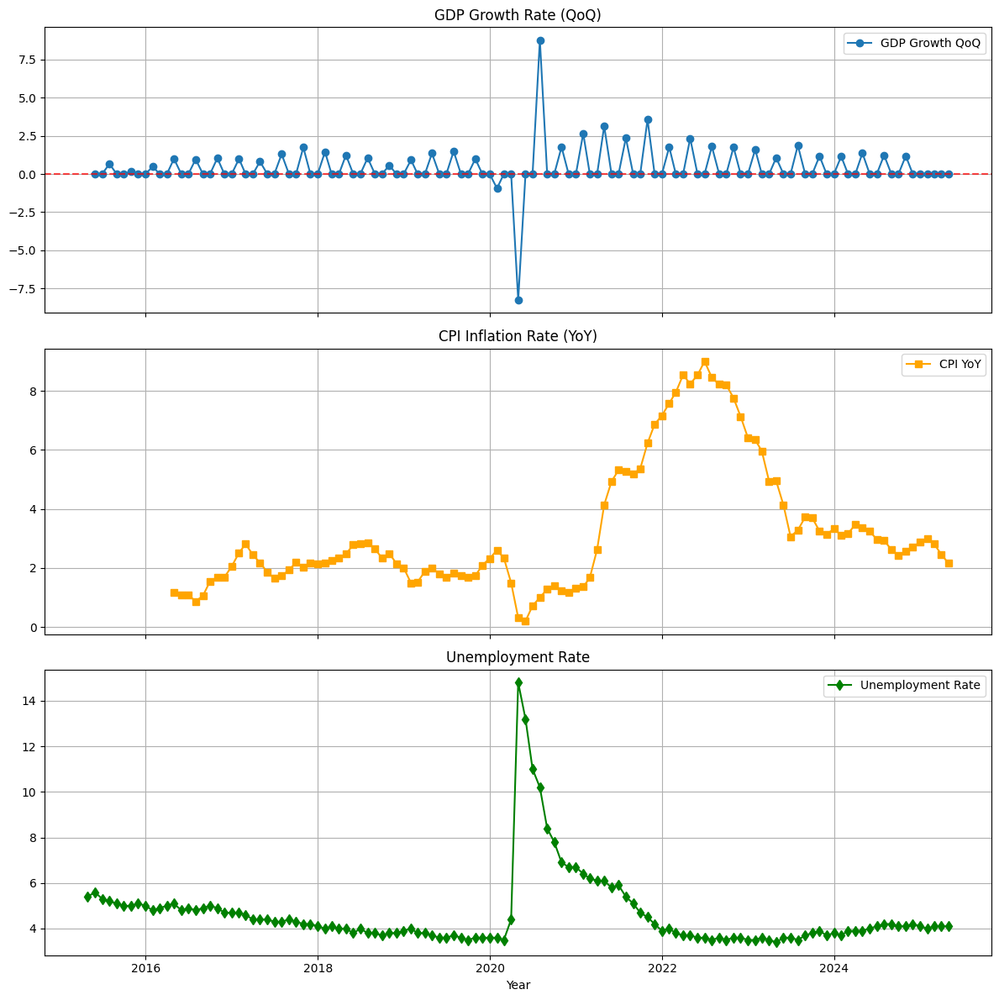

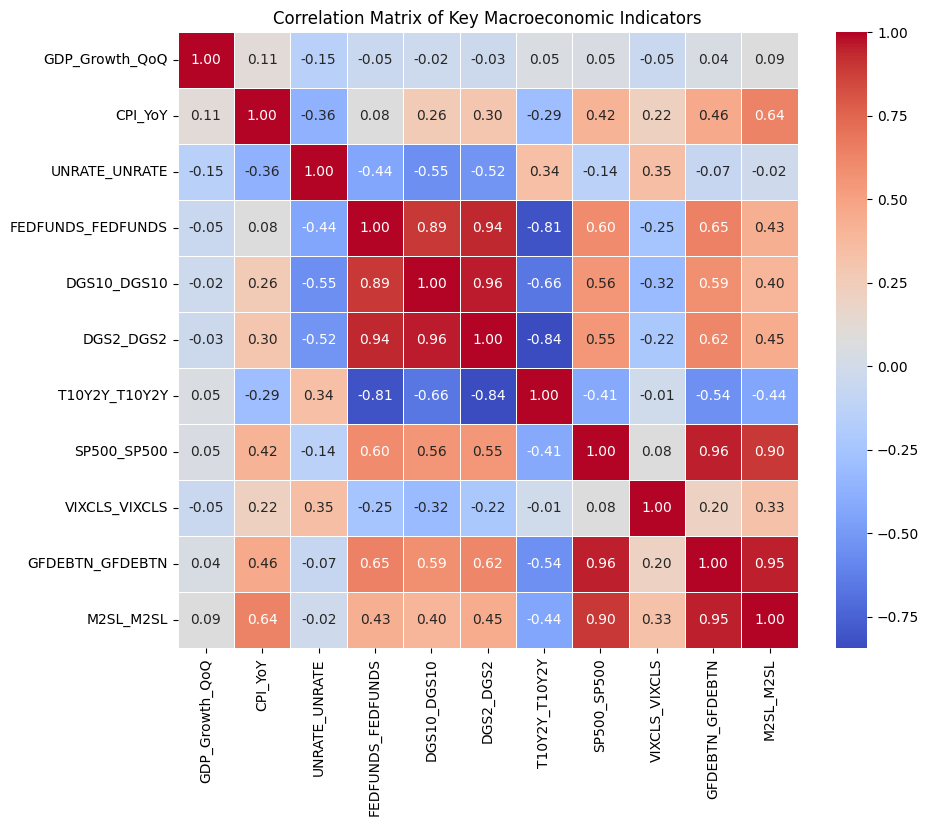

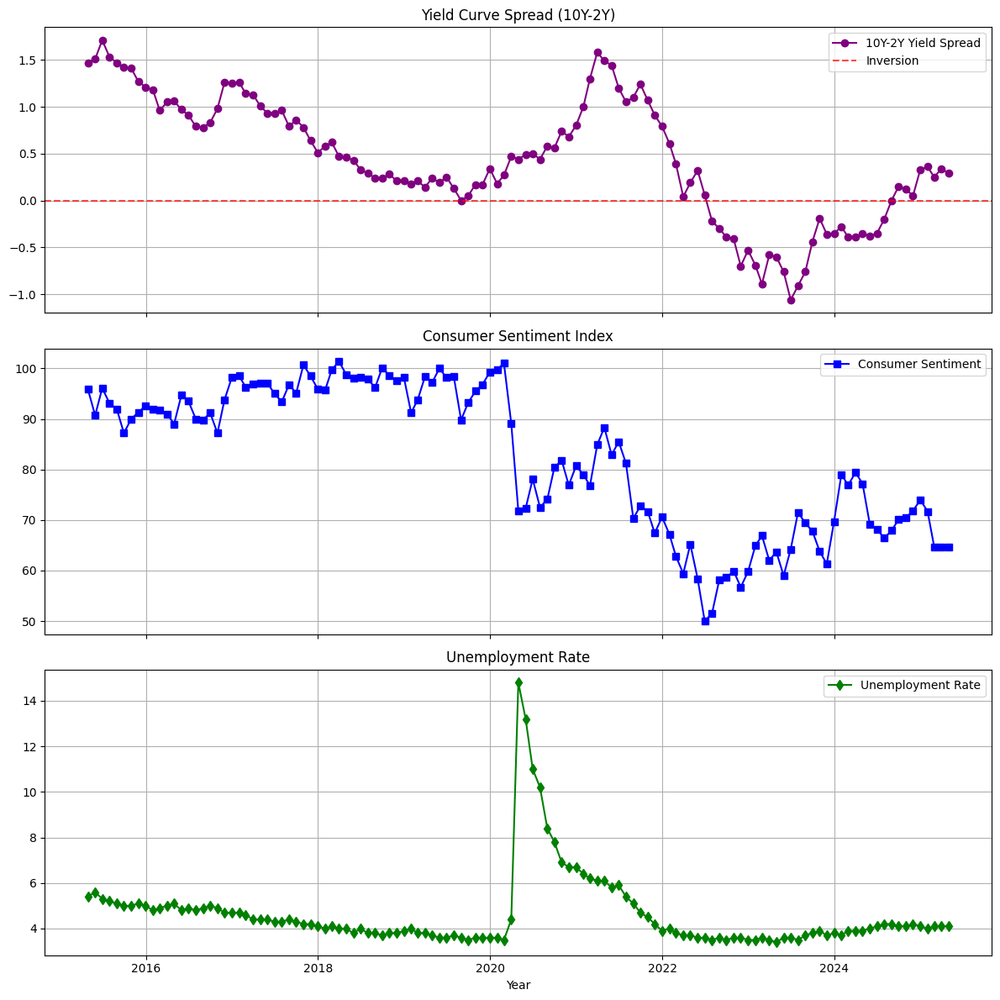

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = "macro_data.csv"  # Update path if necessary
macro_data = pd.read_csv(file_path)

# Convert DATE column to datetime format
macro_data["DATE"] = pd.to_datetime(macro_data["DATE"])

# Select key economic indicators
gdp_growth = macro_data[["DATE", "GDP_Growth_QoQ"]].dropna()
cpi_inflation = macro_data[["DATE", "CPI_YoY"]].dropna()
unemployment = macro_data[["DATE", "UNRATE_UNRATE"]]

# Plot GDP Growth, Inflation, and Unemployment trends
fig, ax = plt.subplots(3, 1, figsize=(12, 12), sharex=True)

ax[0].plot(gdp_growth["DATE"], gdp_growth["GDP_Growth_QoQ"], marker="o", linestyle="-", label="GDP Growth QoQ")
ax[0].set_title("GDP Growth Rate (QoQ)")
ax[0].axhline(y=0, color="red", linestyle="--", alpha=0.7)  # Recession indicator

ax[1].plot(cpi_inflation["DATE"], cpi_inflation["CPI_YoY"], marker="s", linestyle="-", label="CPI YoY", color="orange")
ax[1].set_title("CPI Inflation Rate (YoY)")

ax[2].plot(unemployment["DATE"], unemployment["UNRATE_UNRATE"], marker="d", linestyle="-", label="Unemployment Rate", color="green")
ax[2].set_title("Unemployment Rate")

for a in ax:
    a.legend()
    a.grid(True)

plt.xlabel("Year")
plt.tight_layout()
plt.show()

# Correlation Analysis
corr_columns = [
    "GDP_Growth_QoQ", "CPI_YoY", "UNRATE_UNRATE", "FEDFUNDS_FEDFUNDS", 
    "DGS10_DGS10", "DGS2_DGS2", "T10Y2Y_T10Y2Y", "SP500_SP500", "VIXCLS_VIXCLS", 
    "GFDEBTN_GFDEBTN", "M2SL_M2SL"
]
corr_data = macro_data[corr_columns].dropna()
corr_matrix = corr_data.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix of Key Macroeconomic Indicators")
plt.show()

# Recession Indicators
yield_spread = macro_data[["DATE", "T10Y2Y_T10Y2Y"]]
consumer_sentiment = macro_data[["DATE", "UMCSENT_UMCSENT"]]
unemployment = macro_data[["DATE", "UNRATE_UNRATE"]]

fig, ax = plt.subplots(3, 1, figsize=(12, 12), sharex=True)

ax[0].plot(yield_spread["DATE"], yield_spread["T10Y2Y_T10Y2Y"], marker="o", linestyle="-", label="10Y-2Y Yield Spread", color="purple")
ax[0].set_title("Yield Curve Spread (10Y-2Y)")
ax[0].axhline(y=0, color="red", linestyle="--", alpha=0.7, label="Inversion")
ax[0].legend()

ax[1].plot(consumer_sentiment["DATE"], consumer_sentiment["UMCSENT_UMCSENT"], marker="s", linestyle="-", label="Consumer Sentiment", color="blue")
ax[1].set_title("Consumer Sentiment Index")
ax[1].legend()

ax[2].plot(unemployment["DATE"], unemployment["UNRATE_UNRATE"], marker="d", linestyle="-", label="Unemployment Rate", color="green")
ax[2].set_title("Unemployment Rate")
ax[2].legend()

for a in ax:
    a.grid(True)

plt.xlabel("Year")
plt.tight_layout()
plt.show()


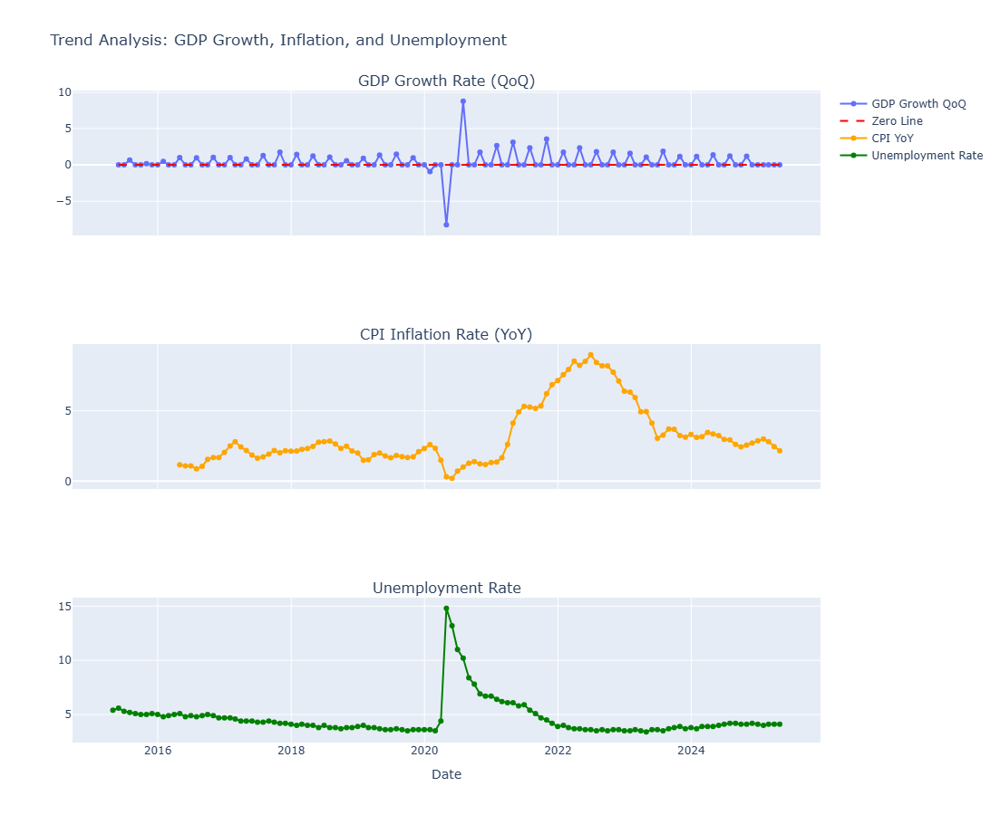

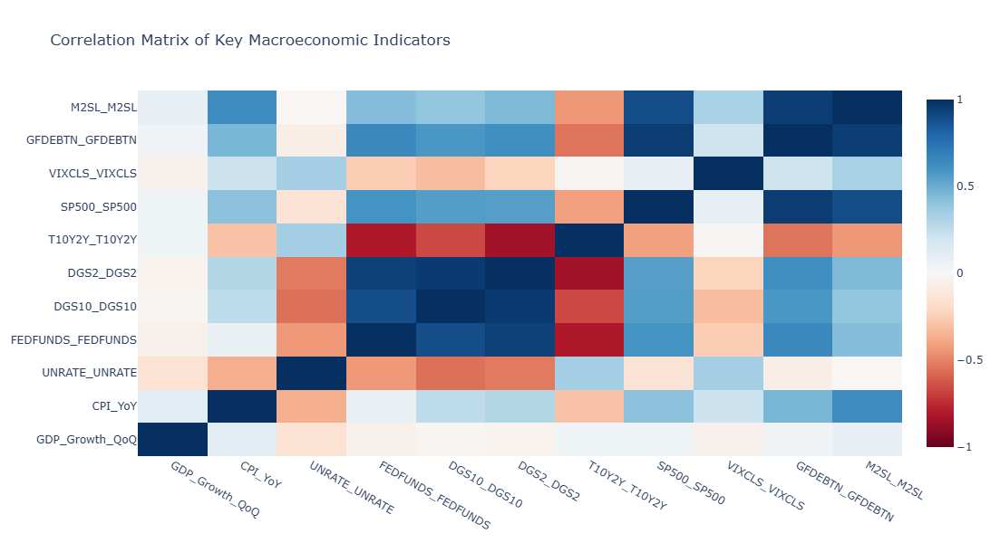

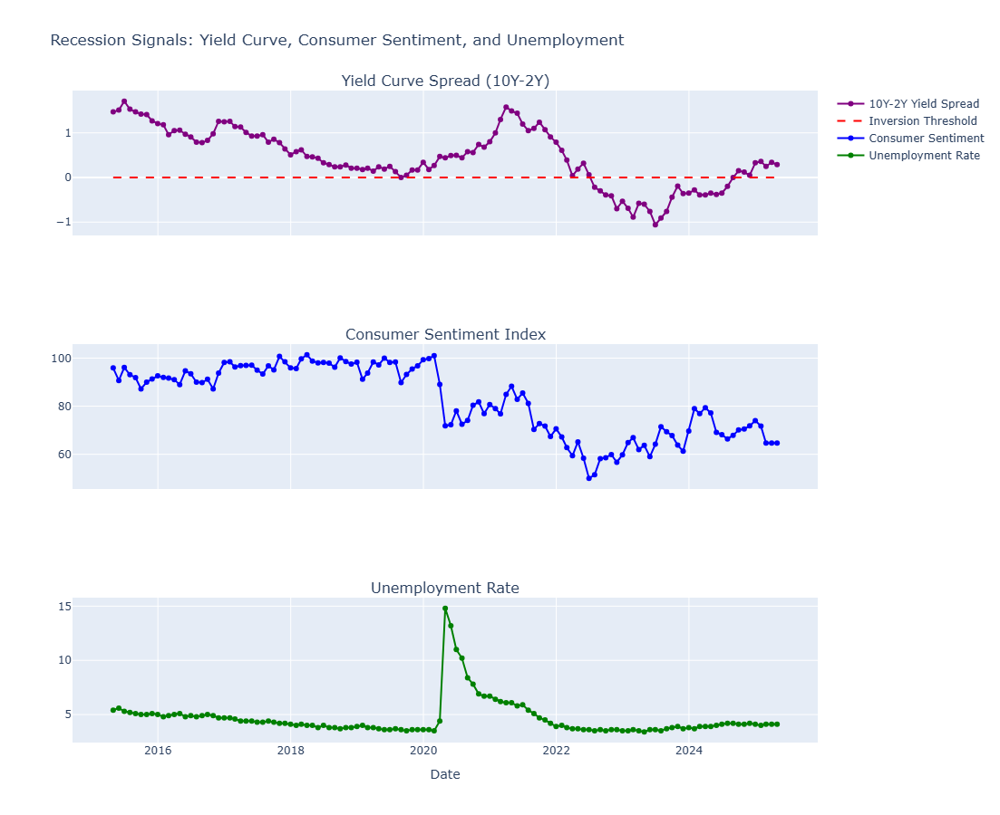

In [4]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Load the dataset
file_path = "macro_data.csv"
macro_data = pd.read_csv(file_path)

# Convert DATE column to datetime
macro_data["DATE"] = pd.to_datetime(macro_data["DATE"])

# -------------------------------
# 1. Trend Analysis: GDP Growth, Inflation, Unemployment
# -------------------------------

# Prepare data for each indicator
gdp_growth = macro_data[["DATE", "GDP_Growth_QoQ"]].dropna()
cpi_inflation = macro_data[["DATE", "CPI_YoY"]].dropna()
unemployment = macro_data[["DATE", "UNRATE_UNRATE"]]

# Create subplots for trend analysis
fig_trends = make_subplots(rows=3, cols=1, shared_xaxes=True,
                           subplot_titles=("GDP Growth Rate (QoQ)",
                                           "CPI Inflation Rate (YoY)",
                                           "Unemployment Rate"))

# GDP Growth
fig_trends.add_trace(
    go.Scatter(x=gdp_growth["DATE"], y=gdp_growth["GDP_Growth_QoQ"],
               mode='lines+markers', name='GDP Growth QoQ'),
    row=1, col=1
)
# Zero line for GDP Growth (reference)
fig_trends.add_trace(
    go.Scatter(x=[gdp_growth["DATE"].min(), gdp_growth["DATE"].max()],
               y=[0, 0], mode="lines", line=dict(color="red", dash="dash"),
               name="Zero Line"),
    row=1, col=1
)

# CPI Inflation
fig_trends.add_trace(
    go.Scatter(x=cpi_inflation["DATE"], y=cpi_inflation["CPI_YoY"],
               mode='lines+markers', name='CPI YoY', line=dict(color="orange")),
    row=2, col=1
)

# Unemployment Rate
fig_trends.add_trace(
    go.Scatter(x=unemployment["DATE"], y=unemployment["UNRATE_UNRATE"],
               mode='lines+markers', name='Unemployment Rate', line=dict(color="green")),
    row=3, col=1
)

fig_trends.update_layout(title_text="Trend Analysis: GDP Growth, Inflation, and Unemployment",
                           height=900)
fig_trends.update_xaxes(title_text="Date", row=3, col=1)
fig_trends.show()

# -------------------------------
# 2. Correlation Analysis: Heatmap of Key Indicators
# -------------------------------

# Select key macroeconomic indicators for correlation analysis
corr_columns = [
    "GDP_Growth_QoQ", "CPI_YoY", "UNRATE_UNRATE", "FEDFUNDS_FEDFUNDS", 
    "DGS10_DGS10", "DGS2_DGS2", "T10Y2Y_T10Y2Y", "SP500_SP500", "VIXCLS_VIXCLS", 
    "GFDEBTN_GFDEBTN", "M2SL_M2SL"
]
corr_data = macro_data[corr_columns].dropna()

# Compute correlation matrix
corr_matrix = corr_data.corr()

# Create correlation heatmap
fig_corr = go.Figure(data=go.Heatmap(
    z=corr_matrix.values,
    x=corr_matrix.columns,
    y=corr_matrix.columns,
    colorscale="RdBu",
    zmid=0,
    text=corr_matrix.round(2).values,
    hoverinfo="text"
))
fig_corr.update_layout(title="Correlation Matrix of Key Macroeconomic Indicators",
                       xaxis_nticks=36, height=600)
fig_corr.show()

# -------------------------------
# 3. Recession Signals: Yield Spread, Consumer Sentiment, Unemployment
# -------------------------------

# Prepare data for recession signals
yield_spread = macro_data[["DATE", "T10Y2Y_T10Y2Y"]]
consumer_sentiment = macro_data[["DATE", "UMCSENT_UMCSENT"]]
unemployment = macro_data[["DATE", "UNRATE_UNRATE"]]

# Create subplots for recession signals
fig_recession = make_subplots(rows=3, cols=1, shared_xaxes=True,
                              subplot_titles=("Yield Curve Spread (10Y-2Y)",
                                              "Consumer Sentiment Index",
                                              "Unemployment Rate"))

# Yield Curve Spread
fig_recession.add_trace(
    go.Scatter(x=yield_spread["DATE"], y=yield_spread["T10Y2Y_T10Y2Y"],
               mode="lines+markers", name="10Y-2Y Yield Spread", line=dict(color="purple")),
    row=1, col=1
)
# Zero line for yield spread
fig_recession.add_trace(
    go.Scatter(x=[yield_spread["DATE"].min(), yield_spread["DATE"].max()],
               y=[0, 0], mode="lines", line=dict(color="red", dash="dash"),
               name="Inversion Threshold"),
    row=1, col=1
)

# Consumer Sentiment
fig_recession.add_trace(
    go.Scatter(x=consumer_sentiment["DATE"], y=consumer_sentiment["UMCSENT_UMCSENT"],
               mode="lines+markers", name="Consumer Sentiment", line=dict(color="blue")),
    row=2, col=1
)

# Unemployment Rate
fig_recession.add_trace(
    go.Scatter(x=unemployment["DATE"], y=unemployment["UNRATE_UNRATE"],
               mode="lines+markers", name="Unemployment Rate", line=dict(color="green")),
    row=3, col=1
)

fig_recession.update_layout(title_text="Recession Signals: Yield Curve, Consumer Sentiment, and Unemployment",
                              height=900)
fig_recession.update_xaxes(title_text="Date", row=3, col=1)
fig_recession.show()


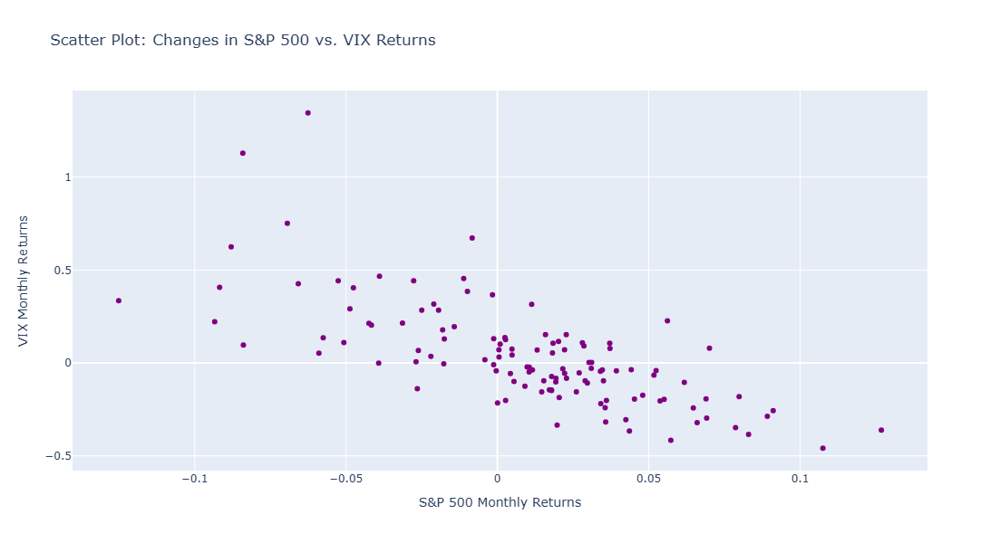

In [6]:
import pandas as pd
import plotly.graph_objects as go

# Load the dataset
file_path = "macro_data.csv"
macro_data = pd.read_csv(file_path)

# Convert the DATE column to datetime
macro_data["DATE"] = pd.to_datetime(macro_data["DATE"])

# Calculate monthly returns for S&P 500
macro_data["SP500_Returns"] = macro_data["SP500_SP500"].pct_change()

# Calculate monthly returns (percentage change) for VIX
macro_data["VIX_Returns"] = macro_data["VIXCLS_VIXCLS"].pct_change()

# Drop any rows with missing returns
returns_data = macro_data.dropna(subset=["SP500_Returns", "VIX_Returns"])

# Create the scatter plot: S&P 500 returns vs. VIX returns
fig_scatter_change = go.Figure()

fig_scatter_change.add_trace(
    go.Scatter(
        x=returns_data["SP500_Returns"],
        y=returns_data["VIX_Returns"],
        mode="markers",
        marker=dict(color="purple"),
        name="Data Points"
    )
)

fig_scatter_change.update_layout(
    title="Scatter Plot: Changes in S&P 500 vs. VIX Returns",
    xaxis_title="S&P 500 Monthly Returns",
    yaxis_title="VIX Monthly Returns",
    height=600
)

fig_scatter_change.show()


In [4]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA

# Load the CSV file (adjust the path if needed)
df = pd.read_csv('macro_data.csv', parse_dates=True)

# Display the first few rows to understand the structure
print("First 5 rows of the dataset:")
print(df.head())

# Display the column names to choose the variable
print("\nColumns in the dataset:")
print(df.columns.tolist())

# dataset contains a date column, set it as the index.

if 'DATE' in df.columns:
    df['DATE'] = pd.to_datetime(df['DATE'])
    df.set_index('DATE', inplace=True)

# Choose a variable for ARIMA modeling.

# if you want to model GDP or inflation, use that column name.

ts = df['GDP_GDP'].dropna()  # Drop missing values if any

# Fit an ARIMA model; here we use order (1,1,1) as an initial guess.
model = ARIMA(ts, order=(1, 1, 1))
model_fit = model.fit()

# Print a tabular summary of the ARIMA model results
print("\nARIMA Model Summary:")
print(model_fit.summary())


# Forecasting the next 8 periods using the ARIMA(1,1,1) model
forecast_steps = 8
forecast_results = model_fit.get_forecast(steps=forecast_steps)
forecast_df = forecast_results.summary_frame(alpha=0.05)

# Displaying the forecast results as a table
print("Forecasted GDP Values for the Next 8 Periods:")
print(forecast_df[['mean', 'mean_ci_lower', 'mean_ci_upper']])



First 5 rows of the dataset:
         DATE    GDP_GDP  GDPC1_GDPC1  GDPPOT_GDPPOT  PCEC_PCEC  \
0  2015-04-30  18279.784    18782.243    18963.01626  12264.140   
1  2015-05-31  18279.784    18782.243    18963.01626  12264.140   
2  2015-06-30  18279.784    18782.243    18963.01626  12264.140   
3  2015-07-31  18401.626    18857.418    19056.83833  12382.494   
4  2015-08-31  18401.626    18857.418    19056.83833  12382.494   

   UNRATE_UNRATE  PAYEMS_PAYEMS  CE16OV_CE16OV  U6RATE_U6RATE  \
0            5.4       141196.0       148511.0           10.9   
1            5.6       141538.0       148817.0           10.9   
2            5.3       141709.0       148816.0           10.4   
3            5.2       141991.0       148830.0           10.3   
4            5.1       142125.0       149181.0           10.2   

   CPIAUCSL_CPIAUCSL  ...  GFDEBTN_GFDEBTN  TOTCI_TOTCI  M2SL_M2SL  \
0            236.222  ...       18151998.0    1852.9063    11937.6   
1            237.001  ...       18151

C:\Users\chour\AppData\Roaming\Python\Python313\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency ME will be used.
  self._init_dates(dates, freq)
C:\Users\chour\AppData\Roaming\Python\Python313\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency ME will be used.
  self._init_dates(dates, freq)
C:\Users\chour\AppData\Roaming\Python\Python313\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency ME will be used.
  self._init_dates(dates, freq)



ARIMA Model Summary:
                               SARIMAX Results                                
Dep. Variable:                GDP_GDP   No. Observations:                  121
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -852.543
Date:                Thu, 03 Apr 2025   AIC                           1711.086
Time:                        18:43:31   BIC                           1719.449
Sample:                    04-30-2015   HQIC                          1714.482
                         - 04-30-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0000      0.001   1139.920      0.000       0.998       1.002
ma.L1         -0.9989      0.040    -25.201      0.000      -1.077      -0.921
sigma2      8.599e+04   4.73e-

# HI